In [62]:
import pandas as pd

## 1. Read Metadata

In [63]:
meta_data = pd.read_csv('../../../For_analysis/RNASequencing/IR3/metaDataIR3.csv')
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [64]:
meta_data.columns

Index(['HudAlphaID', 'QCflagIR3', 'Specimen Bar Code', 'PATNO', 'GENDER',
       'DIAGNOSIS', 'CLINICAL_EVENT', 'Specimen Bar Code.1', 'Quantity (ug)',
       'Concentration (ng/ul)', 'Concentration Flag', 'Submitted Volume (ul)',
       'Normalization Volume (30ng/ul)', 'Total Volume (ul)',
       'Input RNASeq (ng)', 'Input miRNA (ng)', '260/280 Ratio',
       '260/230 Ratio', 'RIN Value', 'BOX', 'POSITION', 'Plate', 'Sample',
       'deletion_length', 'insertion_length', 'mismatch_rate',
       'multimapped_percent', 'uniquely_mapped_percent',
       'num_annotated_splices', 'insertion_rate', 'unmapped_other_percent',
       'multimapped', 'num_splices', 'avg_input_read_length',
       'multimapped_toomany', 'total_reads', 'num_GCAG_splices',
       'unmapped_tooshort', 'unmapped_other', 'unmapped_mismatches_percent',
       'num_noncanonical_splices', 'num_ATAC_splices',
       'multimapped_toomany_percent', 'avg_mapped_read_length',
       'unmapped_mismatches', 'deletion_rate', '

In [65]:
meta_data.PATNO.value_counts()

PATNO
1010     53
1009     53
4104      5
3229      5
3214      5
         ..
42349     1
42298     1
42305     1
42431     1
42312     1
Name: count, Length: 1603, dtype: int64

In [66]:
disease_df = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [67]:
disease_df.DIAGNOSIS.value_counts()

DIAGNOSIS
Genetic Registry    435
PD                  425
Genetic Cohort      418
Control             196
Prodromal            64
SWEDD                63
PDPOOL                1
HCPOOL                1
Name: count, dtype: int64

In [68]:
import os

In [69]:
l = 0
for i in os.listdir('../../../For_analysis/RNASequencing/IR3/quant/'):
    l = l + 1
    print(i)
    if l==3:
        break

PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase2-IR3.3481.BL.0003119333.5104-SL-0197.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase1-IR3.18567.BL.0000302585.5104-SL-1516.longRNA-NEBKAP.salmon.genes.sf


## 2. Read Gene list (Smaller)

In [70]:
gene_excel = pd.ExcelFile('/12tb_dsk3/For_analysis/PD genes.xlsx')
df2 = pd.read_excel(gene_excel, 'Gene_List_Lancet')


In [71]:
df2

,Nearest Gene
0,ASXL3
1,BAG3
2,BIN3
3,BRIP1
4,BST1
...,...
85,UBAP2
86,UBTF
87,VAMP4
88,VPS13C


In [72]:
gene_list = df2['Nearest Gene'].tolist()

In [73]:
import numpy as np
for i in range(100):
    try:
        gene_list.remove(np.nan) # run 4 times
    except:
        break

In [74]:
gene_list = set(gene_list)

In [75]:
len(gene_list )

86

In [76]:

from pybiomart import Server

# Connect to the Ensembl server
server = Server(host='http://www.ensembl.org')
dataset = server.marts['ENSEMBL_MART_ENSEMBL'].datasets['hsapiens_gene_ensembl']  # Replace with your organism

# Query for gene names and Ensembl IDs
# Replace 'BRCA1' with your gene of interest or a list of genes
genes_of_interest = gene_list
query_results = dataset.query(attributes=['external_gene_name', 'ensembl_gene_id'])

# Filter results for your genes of interest
results = query_results[query_results['Gene name'].isin(genes_of_interest)]
print(results)


      Gene name   Gene stable ID
1308     CAB39L  ENSG00000102547
1626     CHRNB1  ENSG00000283946
1765       RIT2  ENSG00000152214
2524     DYRK1A  ENSG00000157540
2928      MEX3C  ENSG00000176624
...         ...              ...
73375      CTSB  ENSG00000164733
81483    FCGR2A  ENSG00000143226
83487      PMVK  ENSG00000163344
83526    NUCKS1  ENSG00000069275
83528     RAB29  ENSG00000117280

[94 rows x 2 columns]


In [77]:
set(gene_list) - set(results['Gene name'].tolist())

{'FAM49B', 'GBAP1', 'GS1-124K5.11', 'LINC00693', 'LOC100131289'}

In [78]:
set(results['Gene name'].tolist()) - set(gene_list) 

set()

In [79]:
keep_genes = results['Gene stable ID'].tolist()

In [80]:
# GBAP1: ENSG00000160766
keep_genes.append('ENSG00000153310')

In [81]:
len(set(keep_genes))

95

In [82]:
len(set(results['Gene name'].tolist()))

81

In [83]:
n=set(results['Gene name'].tolist())

In [84]:
results['Gene name'].value_counts()

Gene name
TRIM40    8
WNT3      3
CRHR1     3
CHRNB1    2
CTSB      2
         ..
UBAP2     1
KCNS3     1
RNF141    1
GBF1      1
FAM47E    1
Name: count, Length: 81, dtype: int64

## 3. Read RNA seq (count normalized)

In [85]:
sample_3813 = pd.read_csv('../../../For_analysis/RNASequencing/IR3/quant/PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf' ,sep = '\t')
m = [i.split('.')[0] for i in sample_3813.Name.tolist()]

In [86]:
len(m)

58294

In [87]:
keep_genes = list(set(m).intersection(keep_genes))

In [88]:
len(keep_genes)

82

In [89]:
l = 0
from tqdm import tqdm
data = pd.DataFrame(columns=keep_genes)
for i in tqdm(os.listdir('../../../For_analysis/RNASequencing/IR3/quant/')):
    if 'genes' not in i:
        continue
    
    read_file_path = '../../../For_analysis/RNASequencing/IR3/quant/'+ str(i)
    df = pd.read_csv(read_file_path ,sep = '\t')
    #print(df.head())
    m = [i.split('.')[0] for i in df.Name.tolist()]
    df['Name'] = m 
    df = df.rename(columns={'TPM': i})
    #print(df.head())
    df = df.set_index('Name')[[i]].T
    
    df = df[keep_genes]
    #print(df.head())
    data = pd.concat([data,df])


  0%|                                                                                                                                         | 0/9513 [00:00<?, ?it/s]/tmp/ipykernel_168412/3419326005.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  data = pd.concat([data,df])
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9513/9513 [02:02<00:00, 77.88it/s]


In [90]:
data.sort_index()

,ENSG00000153310,ENSG00000147439,ENSG00000117280,ENSG00000143772,ENSG00000127419,ENSG00000139793,ENSG00000079841,ENSG00000151338,ENSG00000204614,ENSG00000137073,...,ENSG00000164181,ENSG00000120088,ENSG00000112787,ENSG00000069275,ENSG00000107862,ENSG00000110315,ENSG00000078070,ENSG00000078579,ENSG00000139218,ENSG00000176624
PPMI-Phase1-IR3.1009.POOL.0003202425.5104-SL-0095.longRNA-NEBKAP.salmon.genes.sf,242.493,66.8168,17.39880,26.70800,10.24340,10.18530,0.060975,1.939380,0.282259,12.29780,...,5.82137,0.150721,4.745010,14.50140,7.76369,37.1727,16.88680,0.027200,154.5900,14.50690
PPMI-Phase1-IR3.1009.POOL.0003202427.5104-SL-0287.longRNA-NEBKAP.salmon.genes.sf,136.346,21.5173,11.87730,10.52970,2.82314,5.75805,0.060181,2.430670,0.112875,5.44541,...,4.15324,0.259785,1.743720,12.50460,2.78193,32.2940,8.21090,0.027053,93.6538,10.51850
PPMI-Phase1-IR3.1009.POOL.0003202429.5104-SL-0479.longRNA-NEBKAP.salmon.genes.sf,168.175,33.4758,15.44440,13.15570,5.92248,9.40022,0.073738,2.379350,0.192630,6.64513,...,5.94480,0.109346,3.435600,19.09390,4.65644,39.8852,11.24690,0.040975,122.5600,13.23600
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,147.899,27.1416,14.79430,12.24740,4.34549,8.73068,0.073614,2.568060,0.180983,6.68586,...,4.75035,0.161904,3.665410,18.16080,4.51892,36.4184,9.35643,0.060601,105.1720,12.62140
PPMI-Phase1-IR3.1009.POOL.0003202432.5104-SL-0767.longRNA-NEBKAP.salmon.genes.sf,179.480,32.1220,15.12220,12.91040,3.87437,9.73941,0.051738,2.167490,0.200854,7.08757,...,5.51875,0.154282,2.845310,18.01060,4.06196,39.2304,13.14970,0.026869,135.7370,14.35120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,143.678,20.4672,11.17040,7.61560,3.19648,6.20654,0.030525,1.484440,0.070023,6.26188,...,4.00449,0.000000,1.820100,8.14183,2.37649,31.5888,6.97230,0.069062,80.8218,10.76420
PPMI-Phase2-IR3.92490.V04.0001176681.5104-SL-2875.longRNA-NEBKAP.salmon.genes.sf,154.287,27.0213,14.93380,11.88150,7.15332,6.58722,0.019323,1.799290,0.169226,12.50000,...,5.41380,0.030825,3.340250,11.00280,5.61909,32.7481,10.21820,0.064490,83.5489,8.81951
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,156.620,28.5131,15.49730,11.13620,6.51677,7.70404,0.019259,1.788180,0.039276,11.70240,...,5.50547,0.029808,4.197230,12.26750,5.56125,34.6448,9.41808,0.000000,89.0229,10.40840
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,161.007,26.8370,10.20850,10.01420,2.03971,7.09393,0.013087,1.277930,0.183192,6.89396,...,18.04410,0.006405,1.407690,9.85164,2.85196,45.0229,6.77780,0.008027,103.6700,10.84250


In [91]:
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [92]:
l

0

In [93]:
l = data.index.tolist()
patient_no = [i.split('.')[1] for i in l]
time_point = [i.split('.')[2] for i in l]

In [94]:
data['Patient_Name'] = patient_no 
data['Time_Point'] = time_point

In [95]:
col_index= ['Patient_Name',
 'Time_Point']+ data.columns.tolist()[0:-2]

In [96]:
data = data[col_index]

In [97]:
data = data.sort_values(by = 'Patient_Name', axis = 0)

In [98]:
data

,Patient_Name,Time_Point,ENSG00000153310,ENSG00000147439,ENSG00000117280,ENSG00000143772,ENSG00000127419,ENSG00000139793,ENSG00000079841,ENSG00000151338,...,ENSG00000164181,ENSG00000120088,ENSG00000112787,ENSG00000069275,ENSG00000107862,ENSG00000110315,ENSG00000078070,ENSG00000078579,ENSG00000139218,ENSG00000176624
PPMI-Phase1-IR3.1009.POOL.0003202438.5104-SL-1343.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,143.8860,27.51470,15.37620,12.45160,3.754050,8.52919,0.123286,2.359730,...,5.30883,0.809307,2.906890,14.81610,4.50553,34.0401,10.10120,0.049758,112.7440,12.37140
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,147.8990,27.14160,14.79430,12.24740,4.345490,8.73068,0.073614,2.568060,...,4.75035,0.161904,3.665410,18.16080,4.51892,36.4184,9.35643,0.060601,105.1720,12.62140
PPMI-Phase2-IR3.1009.POOL.0003203727.5104-SL-4014.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,144.8300,30.16570,17.44210,14.32620,4.032940,9.22947,0.101191,3.186460,...,5.46001,0.038518,1.970880,17.85680,4.50494,38.9165,11.13180,0.000000,121.3430,12.81610
PPMI-Phase2-IR3.1009.POOL.0003202434.5104-SL-0959.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,71.6644,9.17746,6.91651,4.92303,1.801830,3.58702,0.049275,1.460870,...,2.57410,0.057009,2.533410,6.80878,1.56676,17.3699,4.52088,0.030002,53.6526,5.52295
PPMI-Phase1-IR3.1009.POOL.0003202442.5104-SL-1719.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,154.6110,31.41810,15.89330,12.66850,5.354950,8.56002,0.110543,2.719890,...,5.00842,0.047461,3.531090,19.96060,3.96128,40.4752,11.74130,0.051018,113.7560,13.11350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,92490,V06,156.6200,28.51310,15.49730,11.13620,6.516770,7.70404,0.019259,1.788180,...,5.50547,0.029808,4.197230,12.26750,5.56125,34.6448,9.41808,0.000000,89.0229,10.40840
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,92490,V02,143.6780,20.46720,11.17040,7.61560,3.196480,6.20654,0.030525,1.484440,...,4.00449,0.000000,1.820100,8.14183,2.37649,31.5888,6.97230,0.069062,80.8218,10.76420
PPMI-Phase1-IR3.92834.BL.0000286784.5104-SL-0950.longRNA-NEBKAP.salmon.genes.sf,92834,BL,31.8739,9.36386,3.87303,3.32203,0.989481,2.30723,0.001791,0.400998,...,7.47179,0.000000,0.678381,3.78201,1.05128,11.5335,2.57940,0.000000,24.2769,2.93999
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,92834,V02,161.0070,26.83700,10.20850,10.01420,2.039710,7.09393,0.013087,1.277930,...,18.04410,0.006405,1.407690,9.85164,2.85196,45.0229,6.77780,0.008027,103.6700,10.84250


In [99]:
data.to_csv('../../../For_analysis/LANCET_PD_Genes_expression.csv',index = False)

In [100]:
temp_meta = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [101]:
temp_meta.PATNO = temp_meta.PATNO.astype(str)

In [102]:
data = pd.merge(data,temp_meta, left_on = 'Patient_Name', right_on = 'PATNO')

In [103]:
keep_columns = ['DIAGNOSIS'] + data.columns.tolist()[0:-2]

In [104]:
data = data[keep_columns]

In [105]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000153310,ENSG00000147439,ENSG00000117280,ENSG00000143772,ENSG00000127419,ENSG00000139793,ENSG00000079841,...,ENSG00000164181,ENSG00000120088,ENSG00000112787,ENSG00000069275,ENSG00000107862,ENSG00000110315,ENSG00000078070,ENSG00000078579,ENSG00000139218,ENSG00000176624
0,PDPOOL,1009,POOL,143.8860,27.51470,15.37620,12.45160,3.754050,8.52919,0.123286,...,5.30883,0.809307,2.906890,14.81610,4.50553,34.0401,10.10120,0.049758,112.7440,12.37140
1,PDPOOL,1009,POOL,147.8990,27.14160,14.79430,12.24740,4.345490,8.73068,0.073614,...,4.75035,0.161904,3.665410,18.16080,4.51892,36.4184,9.35643,0.060601,105.1720,12.62140
2,PDPOOL,1009,POOL,144.8300,30.16570,17.44210,14.32620,4.032940,9.22947,0.101191,...,5.46001,0.038518,1.970880,17.85680,4.50494,38.9165,11.13180,0.000000,121.3430,12.81610
3,PDPOOL,1009,POOL,71.6644,9.17746,6.91651,4.92303,1.801830,3.58702,0.049275,...,2.57410,0.057009,2.533410,6.80878,1.56676,17.3699,4.52088,0.030002,53.6526,5.52295
4,PDPOOL,1009,POOL,154.6110,31.41810,15.89330,12.66850,5.354950,8.56002,0.110543,...,5.00842,0.047461,3.531090,19.96060,3.96128,40.4752,11.74130,0.051018,113.7560,13.11350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,156.6200,28.51310,15.49730,11.13620,6.516770,7.70404,0.019259,...,5.50547,0.029808,4.197230,12.26750,5.56125,34.6448,9.41808,0.000000,89.0229,10.40840
4740,Prodromal,92490,V02,143.6780,20.46720,11.17040,7.61560,3.196480,6.20654,0.030525,...,4.00449,0.000000,1.820100,8.14183,2.37649,31.5888,6.97230,0.069062,80.8218,10.76420
4741,Prodromal,92834,BL,31.8739,9.36386,3.87303,3.32203,0.989481,2.30723,0.001791,...,7.47179,0.000000,0.678381,3.78201,1.05128,11.5335,2.57940,0.000000,24.2769,2.93999
4742,Prodromal,92834,V02,161.0070,26.83700,10.20850,10.01420,2.039710,7.09393,0.013087,...,18.04410,0.006405,1.407690,9.85164,2.85196,45.0229,6.77780,0.008027,103.6700,10.84250


In [106]:
data = data[data.DIAGNOSIS.isin(['PD','Control','Prodromal'])]

In [107]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000153310,ENSG00000147439,ENSG00000117280,ENSG00000143772,ENSG00000127419,ENSG00000139793,ENSG00000079841,...,ENSG00000164181,ENSG00000120088,ENSG00000112787,ENSG00000069275,ENSG00000107862,ENSG00000110315,ENSG00000078070,ENSG00000078579,ENSG00000139218,ENSG00000176624
106,Prodromal,10874,V06,148.9000,28.44800,16.31880,12.44790,4.271640,11.88160,0.006367,...,4.62636,0.000000,3.156450,17.03590,4.93916,35.1697,11.41630,0.000000,122.2640,15.76170
107,Prodromal,10874,BL,152.5730,30.46490,17.63710,9.63887,3.755660,11.89630,0.055233,...,8.41608,0.502434,3.776410,20.80220,3.46756,36.3334,11.61380,0.026518,135.1540,18.37530
108,Prodromal,10874,V04,150.9710,36.88150,18.85970,15.43270,5.983510,11.75380,0.038533,...,6.40536,0.000000,2.816040,20.15610,6.09077,39.1292,12.57320,0.000000,118.3320,15.00670
109,Prodromal,10874,V02,152.5710,35.07170,20.02130,15.92550,4.776700,10.44220,0.340933,...,4.40610,0.309368,4.400690,21.06700,5.33714,40.3661,15.49740,0.154947,116.6720,15.44560
110,Prodromal,12224,V08,153.4080,29.10670,19.98000,19.91090,3.764740,13.39650,0.334335,...,7.89768,0.350550,1.716890,22.10510,4.18877,33.8720,16.92720,0.174025,138.3170,18.92570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,156.6200,28.51310,15.49730,11.13620,6.516770,7.70404,0.019259,...,5.50547,0.029808,4.197230,12.26750,5.56125,34.6448,9.41808,0.000000,89.0229,10.40840
4740,Prodromal,92490,V02,143.6780,20.46720,11.17040,7.61560,3.196480,6.20654,0.030525,...,4.00449,0.000000,1.820100,8.14183,2.37649,31.5888,6.97230,0.069062,80.8218,10.76420
4741,Prodromal,92834,BL,31.8739,9.36386,3.87303,3.32203,0.989481,2.30723,0.001791,...,7.47179,0.000000,0.678381,3.78201,1.05128,11.5335,2.57940,0.000000,24.2769,2.93999
4742,Prodromal,92834,V02,161.0070,26.83700,10.20850,10.01420,2.039710,7.09393,0.013087,...,18.04410,0.006405,1.407690,9.85164,2.85196,45.0229,6.77780,0.008027,103.6700,10.84250


In [108]:
data.columns

Index(['DIAGNOSIS', 'Patient_Name', 'Time_Point', 'ENSG00000153310',
       'ENSG00000147439', 'ENSG00000117280', 'ENSG00000143772',
       'ENSG00000127419', 'ENSG00000139793', 'ENSG00000079841',
       'ENSG00000151338', 'ENSG00000204614', 'ENSG00000137073',
       'ENSG00000109572', 'ENSG00000136492', 'ENSG00000102547',
       'ENSG00000010810', 'ENSG00000157540', 'ENSG00000249231',
       'ENSG00000108379', 'ENSG00000167207', 'ENSG00000196542',
       'ENSG00000187775', 'ENSG00000112306', 'ENSG00000107295',
       'ENSG00000117533', 'ENSG00000144893', 'ENSG00000115041',
       'ENSG00000163344', 'ENSG00000161682', 'ENSG00000189157',
       'ENSG00000198502', 'ENSG00000054983', 'ENSG00000109743',
       'ENSG00000181904', 'ENSG00000145730', 'ENSG00000163463',
       'ENSG00000145349', 'ENSG00000099381', 'ENSG00000136235',
       'ENSG00000198648', 'ENSG00000071054', 'ENSG00000178177',
       'ENSG00000088766', 'ENSG00000116991', 'ENSG00000152128',
       'ENSG00000103528', 'ENSG0000

In [109]:
# comparing control vs all time

In [110]:
data.DIAGNOSIS.value_counts()

DIAGNOSIS
PD           1716
Control       869
Prodromal     254
Name: count, dtype: int64

### 4. Splitting into Control, PD and Prodromal

In [111]:
Control_sample = data[data.DIAGNOSIS == 'Control']
Control_sample.Time_Point.value_counts()

Time_Point
BL     189
V04    179
V02    177
V06    165
V08    159
Name: count, dtype: int64

In [112]:
PD_sample = data[data.DIAGNOSIS == 'PD']
PD_sample.Time_Point.value_counts()

Time_Point
BL     393
V04    354
V06    352
V08    340
V02    277
Name: count, dtype: int64

In [113]:
Prodromal_sample = data[data.DIAGNOSIS == 'Prodromal']
Prodromal_sample.Time_Point.value_counts()

Time_Point
V04    59
V02    59
V06    58
BL     58
V08    20
Name: count, dtype: int64

In [114]:
Control_sample = Control_sample.reset_index(drop=True)
Control_sample 

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000153310,ENSG00000147439,ENSG00000117280,ENSG00000143772,ENSG00000127419,ENSG00000139793,ENSG00000079841,...,ENSG00000164181,ENSG00000120088,ENSG00000112787,ENSG00000069275,ENSG00000107862,ENSG00000110315,ENSG00000078070,ENSG00000078579,ENSG00000139218,ENSG00000176624
0,Control,3000,V02,113.945,29.9291,15.29940,14.73000,3.27648,6.73406,0.005662,...,5.77751,0.003757,1.896850,16.46990,2.91199,30.2401,8.16733,0.010310,98.5875,11.2305
1,Control,3000,V06,122.944,34.6941,15.77600,13.05400,3.18165,9.95158,0.029531,...,4.58175,0.111829,0.919515,23.44510,3.34220,30.2286,13.04500,0.000000,145.0410,14.3639
2,Control,3000,V04,168.115,34.3546,19.52260,13.14430,3.96398,11.29420,0.264265,...,7.30467,1.451510,3.777980,22.12500,3.26359,33.7154,11.17360,0.295754,153.1380,16.5261
3,Control,3000,V08,166.110,41.9724,15.66210,16.16610,3.71119,10.45080,0.018801,...,5.45210,0.021688,1.905160,21.86410,4.24680,46.0623,12.85360,0.000000,145.1030,13.3194
4,Control,3000,BL,149.678,42.8565,18.34060,18.23230,6.51033,9.68304,0.255929,...,9.20262,0.144450,4.162140,18.69720,6.43180,34.5967,13.22310,0.084750,114.7650,12.3883
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
864,Control,4118,BL,131.955,31.7200,15.35110,17.55960,6.00178,8.87448,0.061768,...,5.16862,0.210421,3.158510,15.22900,4.18303,38.0930,14.17590,0.039785,109.8780,10.2426
865,Control,4118,V02,215.050,56.0800,22.33300,17.71060,6.44850,14.40630,0.037930,...,7.62613,0.000000,1.922390,23.96820,5.93888,67.3055,12.67300,0.026043,154.8580,17.8256
866,Control,4139,BL,113.905,26.8060,13.12430,8.08080,2.76328,8.18343,0.128650,...,2.97981,0.158481,1.813480,17.12030,2.27211,43.5846,8.11623,0.110566,95.1226,10.6846
867,Control,4139,V04,127.624,37.6833,15.82500,19.61080,16.36510,4.77439,0.089833,...,2.47726,0.150022,13.518800,12.88520,9.41229,26.8129,6.17774,0.051729,68.2151,10.6029


In [115]:
Prodromal_sample = Prodromal_sample.reset_index(drop=True)
Prodromal_sample

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000153310,ENSG00000147439,ENSG00000117280,ENSG00000143772,ENSG00000127419,ENSG00000139793,ENSG00000079841,...,ENSG00000164181,ENSG00000120088,ENSG00000112787,ENSG00000069275,ENSG00000107862,ENSG00000110315,ENSG00000078070,ENSG00000078579,ENSG00000139218,ENSG00000176624
0,Prodromal,10874,V06,148.9000,28.44800,16.31880,12.44790,4.271640,11.88160,0.006367,...,4.62636,0.000000,3.156450,17.03590,4.93916,35.1697,11.41630,0.000000,122.2640,15.76170
1,Prodromal,10874,BL,152.5730,30.46490,17.63710,9.63887,3.755660,11.89630,0.055233,...,8.41608,0.502434,3.776410,20.80220,3.46756,36.3334,11.61380,0.026518,135.1540,18.37530
2,Prodromal,10874,V04,150.9710,36.88150,18.85970,15.43270,5.983510,11.75380,0.038533,...,6.40536,0.000000,2.816040,20.15610,6.09077,39.1292,12.57320,0.000000,118.3320,15.00670
3,Prodromal,10874,V02,152.5710,35.07170,20.02130,15.92550,4.776700,10.44220,0.340933,...,4.40610,0.309368,4.400690,21.06700,5.33714,40.3661,15.49740,0.154947,116.6720,15.44560
4,Prodromal,12224,V08,153.4080,29.10670,19.98000,19.91090,3.764740,13.39650,0.334335,...,7.89768,0.350550,1.716890,22.10510,4.18877,33.8720,16.92720,0.174025,138.3170,18.92570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249,Prodromal,92490,V06,156.6200,28.51310,15.49730,11.13620,6.516770,7.70404,0.019259,...,5.50547,0.029808,4.197230,12.26750,5.56125,34.6448,9.41808,0.000000,89.0229,10.40840
250,Prodromal,92490,V02,143.6780,20.46720,11.17040,7.61560,3.196480,6.20654,0.030525,...,4.00449,0.000000,1.820100,8.14183,2.37649,31.5888,6.97230,0.069062,80.8218,10.76420
251,Prodromal,92834,BL,31.8739,9.36386,3.87303,3.32203,0.989481,2.30723,0.001791,...,7.47179,0.000000,0.678381,3.78201,1.05128,11.5335,2.57940,0.000000,24.2769,2.93999
252,Prodromal,92834,V02,161.0070,26.83700,10.20850,10.01420,2.039710,7.09393,0.013087,...,18.04410,0.006405,1.407690,9.85164,2.85196,45.0229,6.77780,0.008027,103.6700,10.84250


In [116]:
PD_sample = PD_sample.reset_index(drop=True)
PD_sample 

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000153310,ENSG00000147439,ENSG00000117280,ENSG00000143772,ENSG00000127419,ENSG00000139793,ENSG00000079841,...,ENSG00000164181,ENSG00000120088,ENSG00000112787,ENSG00000069275,ENSG00000107862,ENSG00000110315,ENSG00000078070,ENSG00000078579,ENSG00000139218,ENSG00000176624
0,PD,3001,BL,87.4105,15.83960,8.51538,7.11443,2.76154,5.24386,0.016287,...,2.11661,0.004010,1.495970,9.27174,1.65747,21.4382,7.05213,0.007909,78.0693,8.71842
1,PD,3001,V02,180.8340,36.36800,18.17190,14.18580,4.29279,12.15560,0.054714,...,3.01961,0.136629,2.460930,22.26630,3.89119,38.5115,15.80780,0.024996,158.3250,16.63460
2,PD,3001,V06,102.2380,20.27990,9.67515,8.23423,2.92250,5.29065,0.240547,...,2.80548,0.323092,4.501690,10.78910,2.05096,27.2572,8.51051,0.080478,82.9137,8.34004
3,PD,3001,V08,85.1384,15.10150,7.29432,5.85082,2.41137,4.17514,0.035186,...,2.14181,0.068930,0.525971,9.46508,2.00925,15.4526,5.35146,0.000000,65.6317,6.11991
4,PD,3001,V04,144.4980,27.94200,16.07860,10.63570,3.98404,9.52522,0.079683,...,4.07813,0.237216,2.340270,15.79540,3.50847,40.8056,10.58320,0.013673,133.0680,15.49880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,PD,4135,V04,95.2151,8.52568,6.17458,3.47551,2.30182,5.12156,0.001685,...,5.38727,0.000000,0.369576,9.63335,1.32866,20.5208,5.39648,0.000000,84.9359,7.27260
1712,PD,4135,V02,213.7890,49.78000,19.33850,14.99440,4.90746,10.76470,0.055179,...,8.97094,0.251939,3.915740,20.52330,5.60152,53.0841,13.62140,0.124973,147.5370,13.17810
1713,PD,4136,V06,115.7680,30.61180,17.46180,13.13550,4.83697,8.94451,0.021733,...,4.04566,0.000000,0.840962,15.32060,3.82210,42.1384,10.13060,0.000000,98.8701,14.11780
1714,PD,4136,BL,114.0510,29.69780,16.90950,16.98370,11.30760,6.97237,0.302020,...,7.11755,0.275788,12.481100,16.05030,6.98922,24.5060,9.46446,0.063317,78.4379,11.47270


In [117]:
elements = list(set(data.Time_Point))

In [118]:
import itertools

# Define the list


# Generate all combinations of 2 including reverse pairs
combinations_with_reverse = list(itertools.product(elements, repeat=2))

# Print the result
for combo in combinations_with_reverse:
    print(combo)


('V04', 'V04')
('V04', 'V06')
('V04', 'BL')
('V04', 'V02')
('V04', 'V08')
('V06', 'V04')
('V06', 'V06')
('V06', 'BL')
('V06', 'V02')
('V06', 'V08')
('BL', 'V04')
('BL', 'V06')
('BL', 'BL')
('BL', 'V02')
('BL', 'V08')
('V02', 'V04')
('V02', 'V06')
('V02', 'BL')
('V02', 'V02')
('V02', 'V08')
('V08', 'V04')
('V08', 'V06')
('V08', 'BL')
('V08', 'V02')
('V08', 'V08')


### 5. all combination Control vs PRODROMAL (Logistic Regression)
#####   i.) Run 1000 times to calculate avg feature importance of each genes

In [ ]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import random
import random
import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import random
from itertools import product  # assuming combinations_with_reverse is some kind of product

ACCURACY_DICT = dict()
MAX_SAMPLES = dict()
FEATURE_IMPORTANCES = dict()

F1_SCORES = dict()
PRECISION_SCORES = dict()
RECALL_SCORES = dict()
AUC_SCORES = dict()

for combo in tqdm(combinations_with_reverse):
    
    PD_sample_ = PD_sample[PD_sample.Time_Point== combo[0]].iloc[:,3:]
    PD_sample_ = PD_sample_.reset_index(drop = True)
    
    Control_sample_ = Control_sample[Control_sample.Time_Point== combo[1]].iloc[:,3:]
    Control_sample_ = Control_sample_.reset_index(drop = True)

    
    accuracies_temp = []
    auc_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    
    for i in range(1000):
        
        max_num = min(len(PD_sample_),len(Control_sample_))
        
        random_numbers = random.sample(range(0, max_num), max_num)
        
        PD_sample_temp = PD_sample_.iloc[random_numbers,:]
        
        Control_sample_temp = Control_sample_.iloc[random_numbers,:]
        
        X = pd.concat([PD_sample_temp,Control_sample_temp])
        
        y = [0 for i in range(len(PD_sample_temp))] + [1 for i in range(len(Control_sample_temp))]
    
    
    # Stratified train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, stratify=y, random_state=42
        )
        
        # Initialize and fit the Logistic Regression model
        model = LogisticRegression(max_iter=150000)
        rfe = RFE(estimator=model,n_features_to_select=82)  # Select top 10 features, adjust as needed
        X_train_rfe = rfe.fit_transform(X_train, y_train)
        X_test_rfe = rfe.transform(X_test)


        selected_features = X.columns[rfe.support_]
        feature_ranks = rfe.ranking_
        model.fit(X_train_rfe, y_train)
        
        # Predict and evaluate the model
        y_pred = model.predict(X_test_rfe)
        y_prob = model.predict_proba(X_test_rfe)[:, 1]  # probability for the positive class
        
        accuracy = accuracy_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_prob)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        accuracies_temp.append(accuracy)
        auc_scores.append(auc)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)
        # Store feature names and scores for the first iteration only, to avoid redundancy
        
        coefficients = model.coef_.flatten()
        feature_coefficients = dict(zip(selected_features, coefficients))
        FEATURE_IMPORTANCES[f'PD_{combo[0]}_Control_{combo[1]}_{i}'] = feature_coefficients
        
        

    ACCURACY_DICT[f'PD_{combo[0]}_control_{combo[1]}'] = np.mean(accuracies_temp)
    MAX_SAMPLES[f'PD_{combo[0]}_control_{combo[1]}'] = max_num
    PRECISION_SCORES[f'PD_{combo[0]}_control_{combo[1]}'] =  np.mean(precision_scores)
    RECALL_SCORES[f'PD_{combo[0]}_control_{combo[1]}'] =  np.mean(recall_scores)
    AUC_SCORES[f'PD_{combo[0]}_control_{combo[1]}'] =  np.mean(auc_scores)
    
    # Storing additional metrics
    print(f"Metrics for Prodromal_{combo[0]}_PD_{combo[1]}:")
    print(f"Accuracy: {np.mean(accuracies_temp)}")
    print(f"AUC: {np.mean(auc_scores)}")
    print(f"Precision: {np.mean(precision_scores)}")
    print(f"Recall: {np.mean(recall_scores)}")
    print(f"F1 Score: {np.mean(f1_scores)}")



  0%|                                                                                                                                           | 0/25 [00:00<?, ?it/s]/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stabl

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Control= []
PD= []
auc = []
for i,j in AUC_SCORES.items():
    PD.append(i.split('_')[1])
    Control.append(i.split('_')[-1])
    auc.append(j)


auc_table_pd_control  = pd.DataFrame([PD,Control,auc]).T
auc_table_pd_control  = auc_table_pd_control.rename(columns = {0:'PD', 1:'control', 2: 'AUC'})

auc_table_pd_control['AUC'] = auc_table_pd_control['AUC'].astype(float)
heatmap_data_ = auc_table_pd_control.pivot(index="control", columns="PD", values="AUC")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'AUC'})
plt.title("AUC Heatmap for vs PD vs Control Combinations")
plt.savefig("../heatmaps_plots/auc_heatmaps/lancet_con_vs_pd_auc_heatmap.svg", format='svg')

plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

PD = []
Control= []
acc = []
for i,j in ACCURACY_DICT.items():
    PD.append(i.split('_')[1])
    Control.append(i.split('_')[-1])
    acc.append(j)


accuracy_table_pd_control = pd.DataFrame([PD,Control,acc]).T
accuracy_table_pd_control  = accuracy_table_pd_control.rename(columns = {0:'PD', 1:'control', 2: 'Accuracy'})

accuracy_table_pd_control['Accuracy'] = accuracy_table_pd_control['Accuracy'].astype(float)
heatmap_data_ = accuracy_table_pd_control.pivot(index="control", columns="PD", values="Accuracy")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Accuracy'})
plt.title("Accuracy Heatmap for PD vs Control Combinations")
plt.savefig("../heatmaps_plots/accuracy_heatmaps/lancet_con_vs_pd_accuracy_heatmap.svg", format='svg')

plt.show()

In [ ]:
df_acc = pd.DataFrame(list(ACCURACY_DICT.items()), columns=['Comparison', 'Accuracy'])
df_auc = pd.DataFrame(list(AUC_SCORES.items()), columns=['Comparison', 'AUC'])
#df_f1  = pd.DataFrame(list(F1_SCORES.items()), columns=['Comparison', 'F1'])
df_precision = pd.DataFrame(list(PRECISION_SCORES.items()), columns=['Comparison', 'Precision'])
df_recall = pd.DataFrame(list(RECALL_SCORES.items()), columns=['Comparison', 'Recall'])

import pandas as pd
from functools import reduce

# List of DataFrames to merge
dfs = [df_acc, df_auc, df_precision, df_recall]

# Merge all DataFrames on 'Comparison'
df_all = reduce(lambda left, right: pd.merge(left, right, on='Comparison'), dfs)

df_all.to_csv('../metrics_csv_files/metrics_lancet_con_vs_pd.csv',index = False)

In [58]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000153310,ENSG00000147439,ENSG00000117280,ENSG00000143772,ENSG00000127419,ENSG00000139793,ENSG00000079841,...,ENSG00000164181,ENSG00000120088,ENSG00000112787,ENSG00000069275,ENSG00000107862,ENSG00000110315,ENSG00000078070,ENSG00000078579,ENSG00000139218,ENSG00000176624
106,Prodromal,10874,V06,148.9000,28.44800,16.31880,12.44790,4.271640,11.88160,0.006367,...,4.62636,0.000000,3.156450,17.03590,4.93916,35.1697,11.41630,0.000000,122.2640,15.76170
107,Prodromal,10874,BL,152.5730,30.46490,17.63710,9.63887,3.755660,11.89630,0.055233,...,8.41608,0.502434,3.776410,20.80220,3.46756,36.3334,11.61380,0.026518,135.1540,18.37530
108,Prodromal,10874,V04,150.9710,36.88150,18.85970,15.43270,5.983510,11.75380,0.038533,...,6.40536,0.000000,2.816040,20.15610,6.09077,39.1292,12.57320,0.000000,118.3320,15.00670
109,Prodromal,10874,V02,152.5710,35.07170,20.02130,15.92550,4.776700,10.44220,0.340933,...,4.40610,0.309368,4.400690,21.06700,5.33714,40.3661,15.49740,0.154947,116.6720,15.44560
110,Prodromal,12224,V08,153.4080,29.10670,19.98000,19.91090,3.764740,13.39650,0.334335,...,7.89768,0.350550,1.716890,22.10510,4.18877,33.8720,16.92720,0.174025,138.3170,18.92570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,156.6200,28.51310,15.49730,11.13620,6.516770,7.70404,0.019259,...,5.50547,0.029808,4.197230,12.26750,5.56125,34.6448,9.41808,0.000000,89.0229,10.40840
4740,Prodromal,92490,V02,143.6780,20.46720,11.17040,7.61560,3.196480,6.20654,0.030525,...,4.00449,0.000000,1.820100,8.14183,2.37649,31.5888,6.97230,0.069062,80.8218,10.76420
4741,Prodromal,92834,BL,31.8739,9.36386,3.87303,3.32203,0.989481,2.30723,0.001791,...,7.47179,0.000000,0.678381,3.78201,1.05128,11.5335,2.57940,0.000000,24.2769,2.93999
4742,Prodromal,92834,V02,161.0070,26.83700,10.20850,10.01420,2.039710,7.09393,0.013087,...,18.04410,0.006405,1.407690,9.85164,2.85196,45.0229,6.77780,0.008027,103.6700,10.84250


In [59]:
tmp_data = data[data.Time_Point !='V02']

In [60]:
tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000153310,ENSG00000147439,ENSG00000117280,ENSG00000143772,ENSG00000127419,ENSG00000139793,ENSG00000079841,...,ENSG00000164181,ENSG00000120088,ENSG00000112787,ENSG00000069275,ENSG00000107862,ENSG00000110315,ENSG00000078070,ENSG00000078579,ENSG00000139218,ENSG00000176624
106,Prodromal,10874,V06,148.9000,28.44800,16.31880,12.44790,4.271640,11.88160,0.006367,...,4.62636,0.000000,3.156450,17.03590,4.93916,35.1697,11.41630,0.000000,122.2640,15.76170
107,Prodromal,10874,BL,152.5730,30.46490,17.63710,9.63887,3.755660,11.89630,0.055233,...,8.41608,0.502434,3.776410,20.80220,3.46756,36.3334,11.61380,0.026518,135.1540,18.37530
108,Prodromal,10874,V04,150.9710,36.88150,18.85970,15.43270,5.983510,11.75380,0.038533,...,6.40536,0.000000,2.816040,20.15610,6.09077,39.1292,12.57320,0.000000,118.3320,15.00670
110,Prodromal,12224,V08,153.4080,29.10670,19.98000,19.91090,3.764740,13.39650,0.334335,...,7.89768,0.350550,1.716890,22.10510,4.18877,33.8720,16.92720,0.174025,138.3170,18.92570
111,Prodromal,12224,V06,198.3980,30.83010,20.70780,21.13660,4.857810,10.33140,0.104436,...,10.00120,0.165029,2.928300,20.02780,4.57882,34.9338,13.96210,0.000000,132.8190,14.33540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4737,Prodromal,92490,BL,166.9130,23.69890,10.93270,8.92586,4.605600,6.15724,0.013500,...,3.52633,0.000000,1.190760,9.39098,3.71956,34.9713,7.38354,0.000000,98.7931,8.78601
4738,Prodromal,92490,V04,154.2870,27.02130,14.93380,11.88150,7.153320,6.58722,0.019323,...,5.41380,0.030825,3.340250,11.00280,5.61909,32.7481,10.21820,0.064490,83.5489,8.81951
4739,Prodromal,92490,V06,156.6200,28.51310,15.49730,11.13620,6.516770,7.70404,0.019259,...,5.50547,0.029808,4.197230,12.26750,5.56125,34.6448,9.41808,0.000000,89.0229,10.40840
4741,Prodromal,92834,BL,31.8739,9.36386,3.87303,3.32203,0.989481,2.30723,0.001791,...,7.47179,0.000000,0.678381,3.78201,1.05128,11.5335,2.57940,0.000000,24.2769,2.93999


In [61]:
tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000153310,ENSG00000147439,ENSG00000117280,ENSG00000143772,ENSG00000127419,ENSG00000139793,ENSG00000079841,...,ENSG00000164181,ENSG00000120088,ENSG00000112787,ENSG00000069275,ENSG00000107862,ENSG00000110315,ENSG00000078070,ENSG00000078579,ENSG00000139218,ENSG00000176624
106,Prodromal,10874,V06,148.9000,28.44800,16.31880,12.44790,4.271640,11.88160,0.006367,...,4.62636,0.000000,3.156450,17.03590,4.93916,35.1697,11.41630,0.000000,122.2640,15.76170
107,Prodromal,10874,BL,152.5730,30.46490,17.63710,9.63887,3.755660,11.89630,0.055233,...,8.41608,0.502434,3.776410,20.80220,3.46756,36.3334,11.61380,0.026518,135.1540,18.37530
108,Prodromal,10874,V04,150.9710,36.88150,18.85970,15.43270,5.983510,11.75380,0.038533,...,6.40536,0.000000,2.816040,20.15610,6.09077,39.1292,12.57320,0.000000,118.3320,15.00670
110,Prodromal,12224,V08,153.4080,29.10670,19.98000,19.91090,3.764740,13.39650,0.334335,...,7.89768,0.350550,1.716890,22.10510,4.18877,33.8720,16.92720,0.174025,138.3170,18.92570
111,Prodromal,12224,V06,198.3980,30.83010,20.70780,21.13660,4.857810,10.33140,0.104436,...,10.00120,0.165029,2.928300,20.02780,4.57882,34.9338,13.96210,0.000000,132.8190,14.33540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4737,Prodromal,92490,BL,166.9130,23.69890,10.93270,8.92586,4.605600,6.15724,0.013500,...,3.52633,0.000000,1.190760,9.39098,3.71956,34.9713,7.38354,0.000000,98.7931,8.78601
4738,Prodromal,92490,V04,154.2870,27.02130,14.93380,11.88150,7.153320,6.58722,0.019323,...,5.41380,0.030825,3.340250,11.00280,5.61909,32.7481,10.21820,0.064490,83.5489,8.81951
4739,Prodromal,92490,V06,156.6200,28.51310,15.49730,11.13620,6.516770,7.70404,0.019259,...,5.50547,0.029808,4.197230,12.26750,5.56125,34.6448,9.41808,0.000000,89.0229,10.40840
4741,Prodromal,92834,BL,31.8739,9.36386,3.87303,3.32203,0.989481,2.30723,0.001791,...,7.47179,0.000000,0.678381,3.78201,1.05128,11.5335,2.57940,0.000000,24.2769,2.93999


In [85]:
genes = df[0].values.tolist()

In [86]:
control_tmp_data = tmp_data[tmp_data['New_Time_Point_2'].str.startswith('Control')]
control_tmp_data = control_tmp_data.sort_values(by = 'New_Time_Point') 
control_tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000107862,ENSG00000117533,ENSG00000150672,ENSG00000130787,ENSG00000102547,ENSG00000151929,ENSG00000129003,...,ENSG00000164733,ENSG00000071054,ENSG00000110315,ENSG00000177455,ENSG00000078579,ENSG00000198502,ENSG00000136235,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,3.61118,6.03974,1.649230,4.29506,2.76761,0.464873,62.4584,...,139.1050,39.36910,42.98610,0.750658,0.233529,14.87900,0.364765,Control,1.Control_BL,Control_BL
497,1.Control,3114,BL,2.79440,3.80543,1.292410,5.17357,1.43745,0.638642,44.4942,...,114.3770,27.02600,22.34800,0.981209,0.000000,32.86870,0.250215,Control,1.Control_BL,Control_BL
782,1.Control,3222,BL,1.91614,4.27361,1.040990,1.93573,1.65862,0.314329,43.4593,...,82.3283,21.85380,25.51900,0.515720,0.000000,7.64602,0.254178,Control,1.Control_BL,Control_BL
777,1.Control,3221,BL,4.18377,5.07759,1.365260,7.19952,1.46568,1.205380,45.1880,...,137.0840,27.81740,23.57870,0.847392,0.039283,11.02960,0.205204,Control,1.Control_BL,Control_BL
596,1.Control,3161,BL,1.95178,3.74914,0.696077,3.22321,1.24050,0.473274,33.2601,...,122.3340,25.24380,28.12820,0.740772,0.000000,6.84389,0.094266,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1090,1.Control,3361,V08,3.79255,4.40550,0.556846,3.35933,1.89466,0.303432,42.1625,...,145.6940,48.96530,47.49860,0.638957,0.000000,13.98690,0.184405,Control,1.Control_V08,Control_V08
1722,1.Control,3570,V08,3.63490,5.56226,1.284520,2.81345,3.11253,0.323246,60.8739,...,84.8322,30.22440,31.70400,0.453559,0.011955,3.90411,0.335681,Control,1.Control_V08,Control_V08
1598,1.Control,3523,V08,1.28275,3.65903,0.581871,1.73383,1.06787,0.278438,30.4579,...,69.5742,8.91127,9.45647,0.346413,0.023747,14.85600,0.082091,Control,1.Control_V08,Control_V08
2498,1.Control,3950,V08,6.43715,4.08913,0.741212,6.13065,1.38672,0.948265,38.6180,...,88.6818,49.27250,31.04030,0.821288,0.016800,13.87260,0.273081,Control,1.Control_V08,Control_V08


In [87]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        print(ensembleid)
        return ensembleid


### 6. Expression of Genes with time 

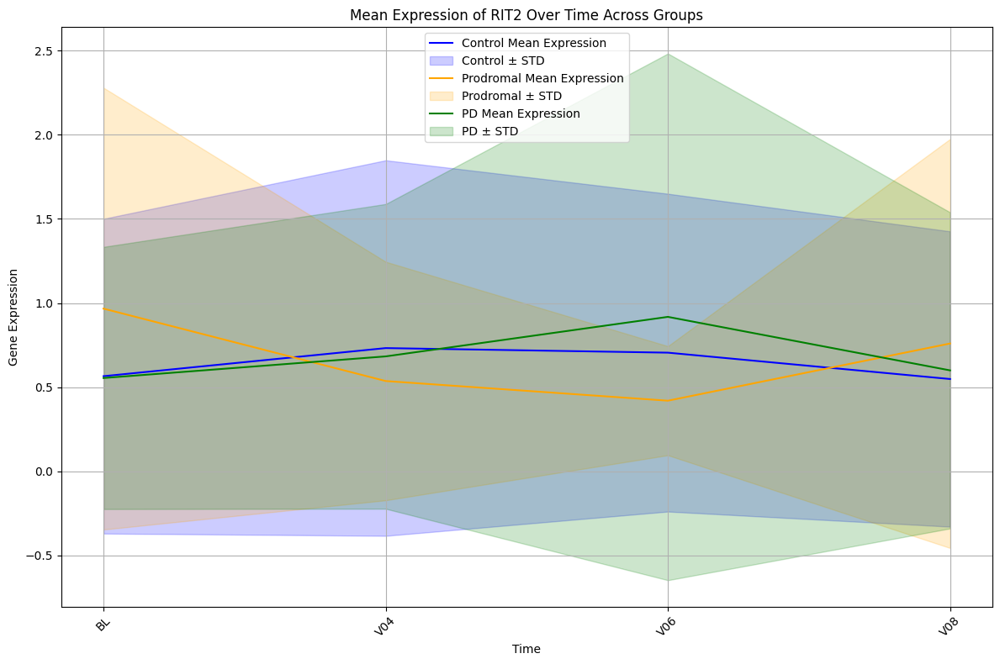

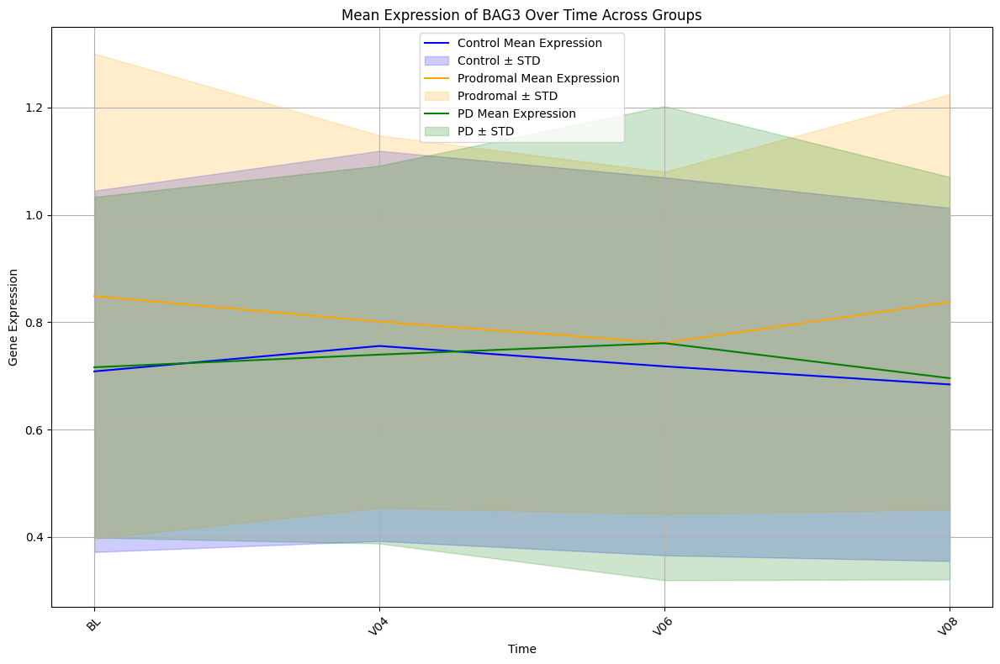

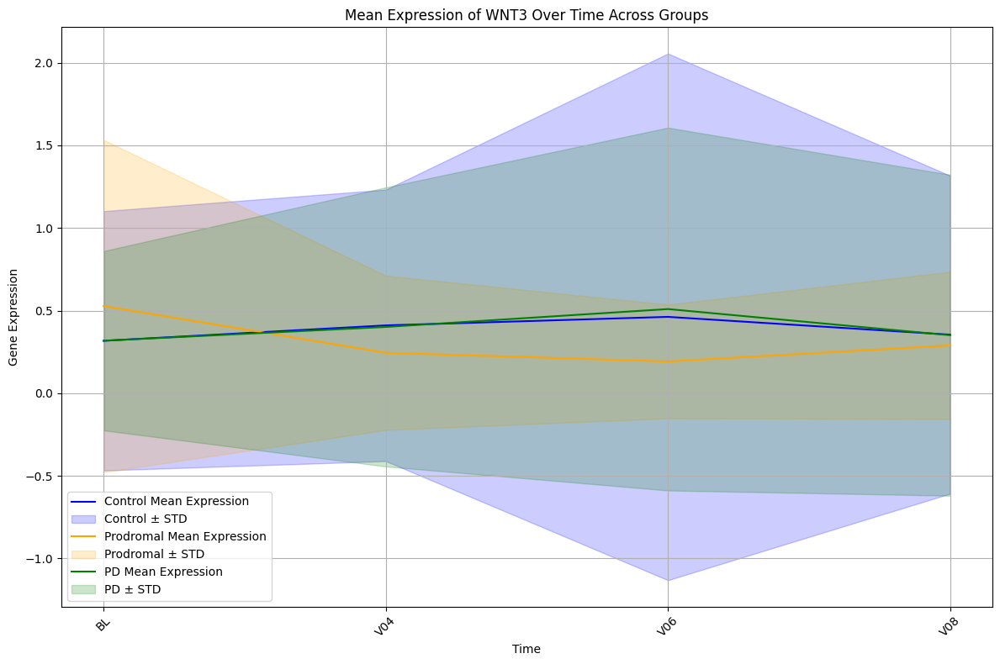

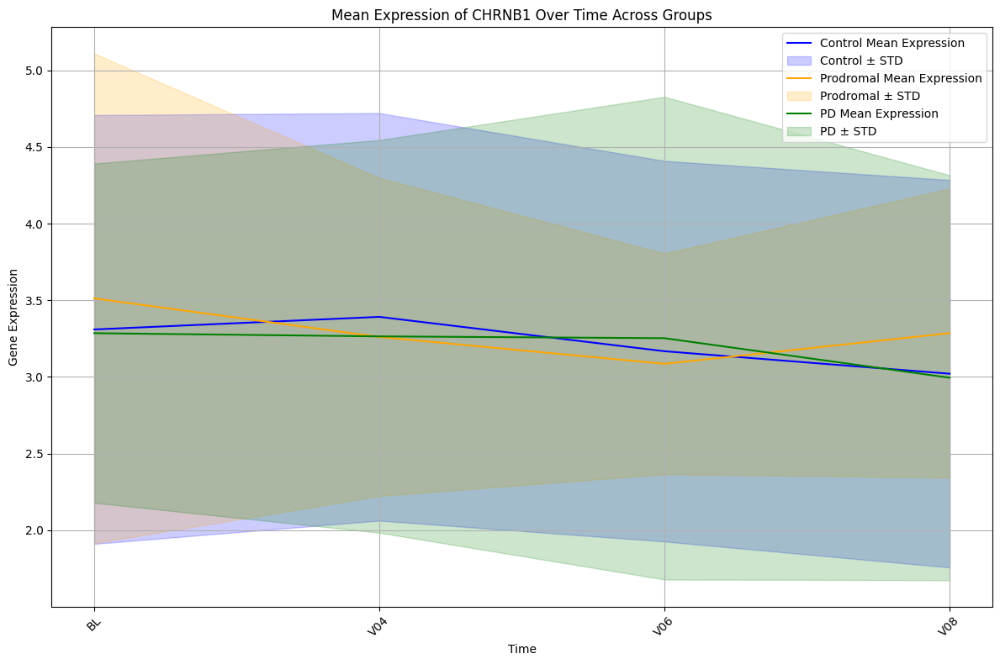

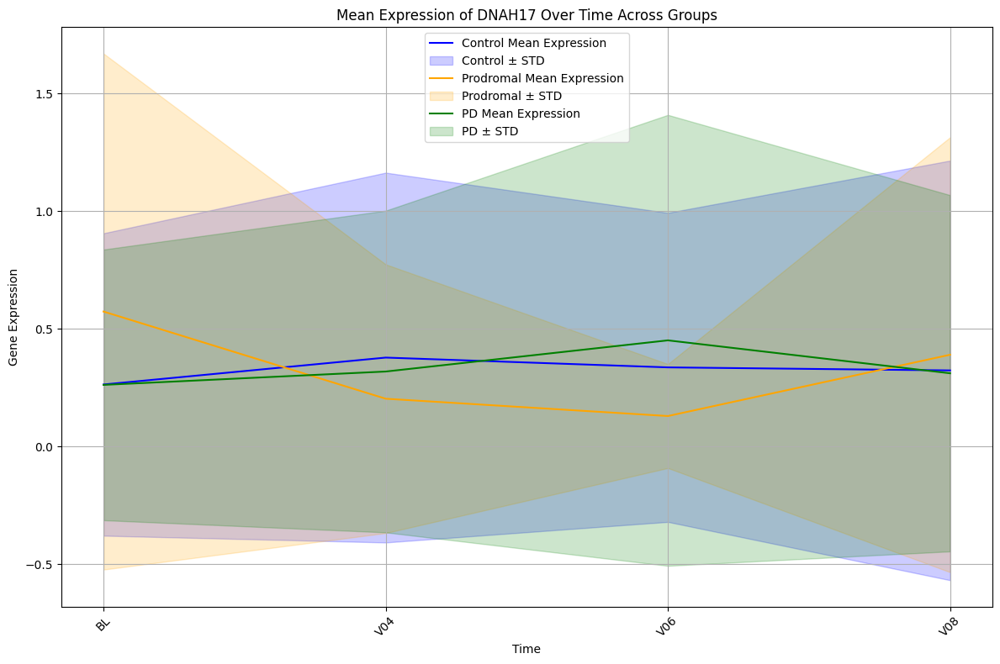

...

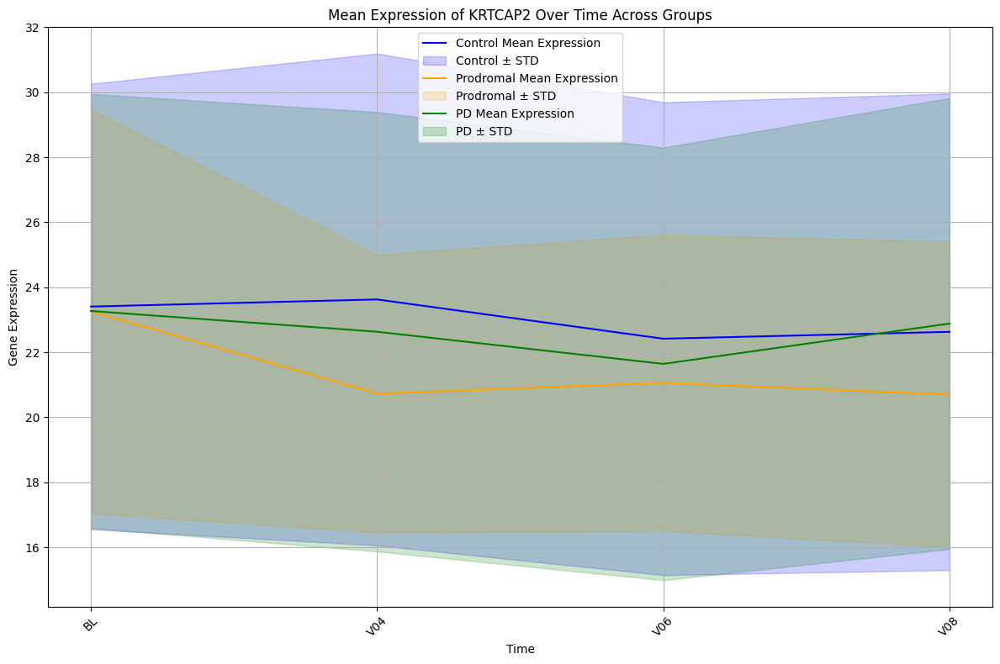

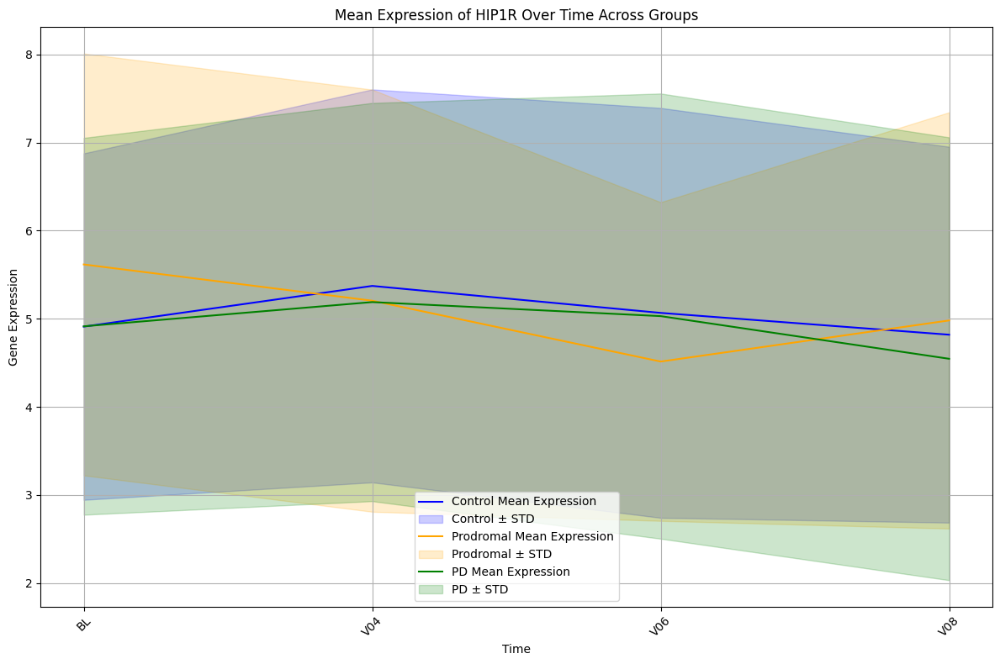

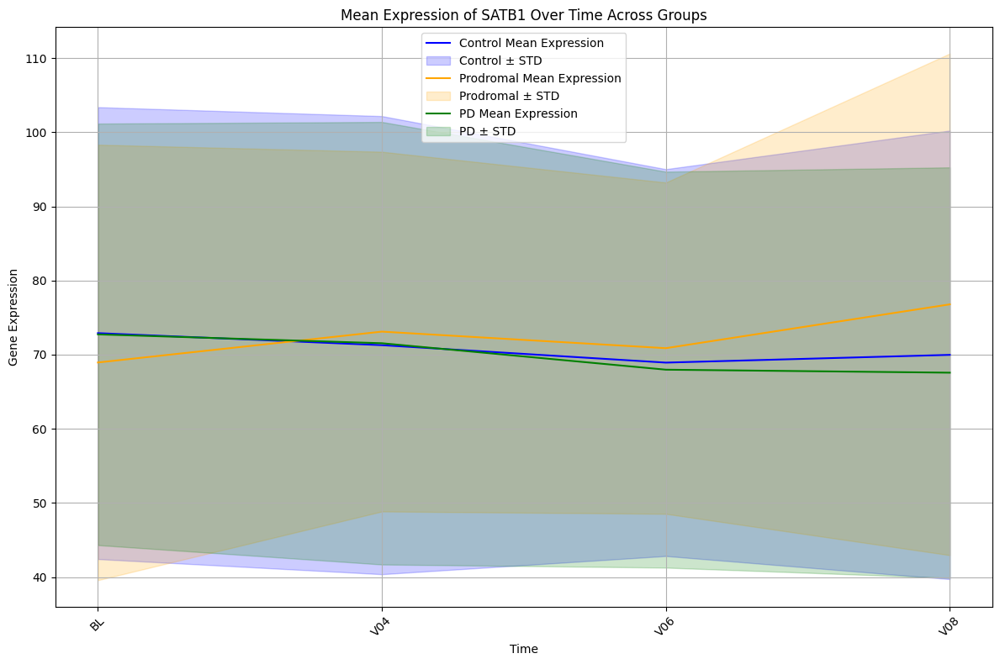

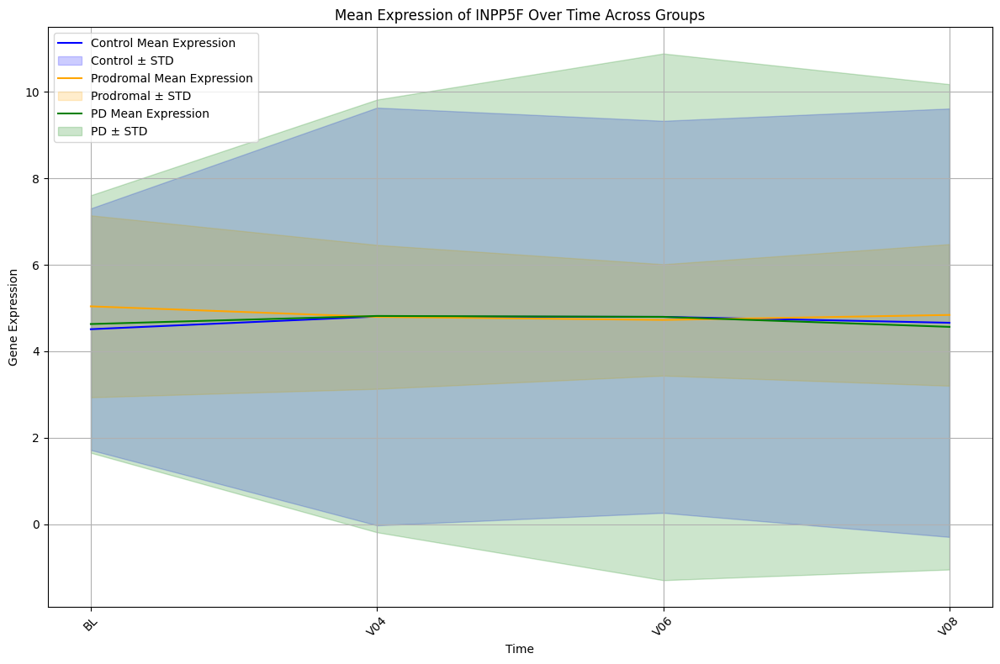

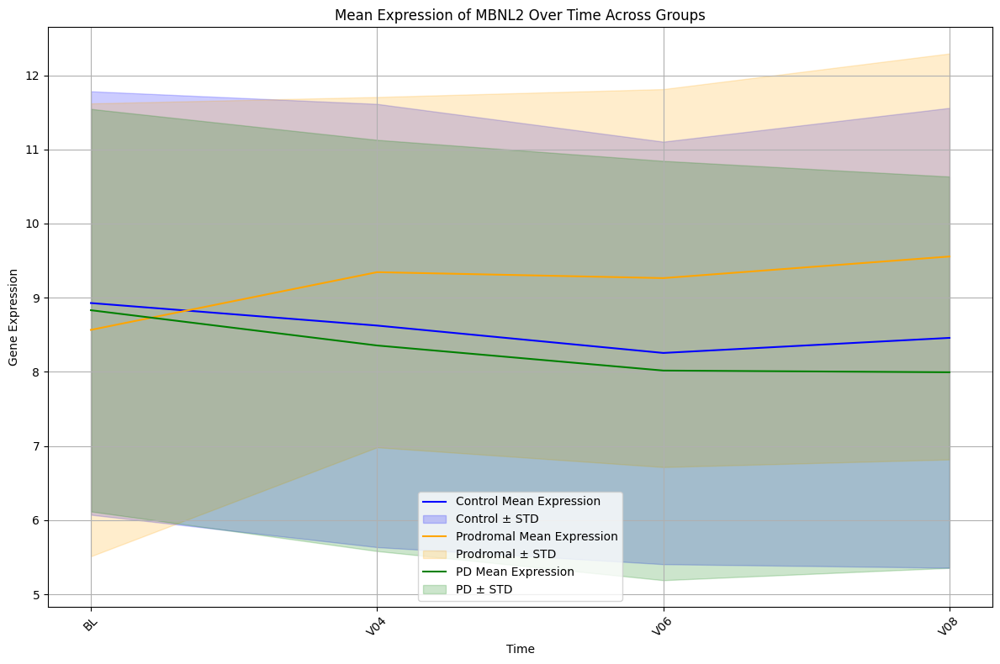

ENSG00000153310


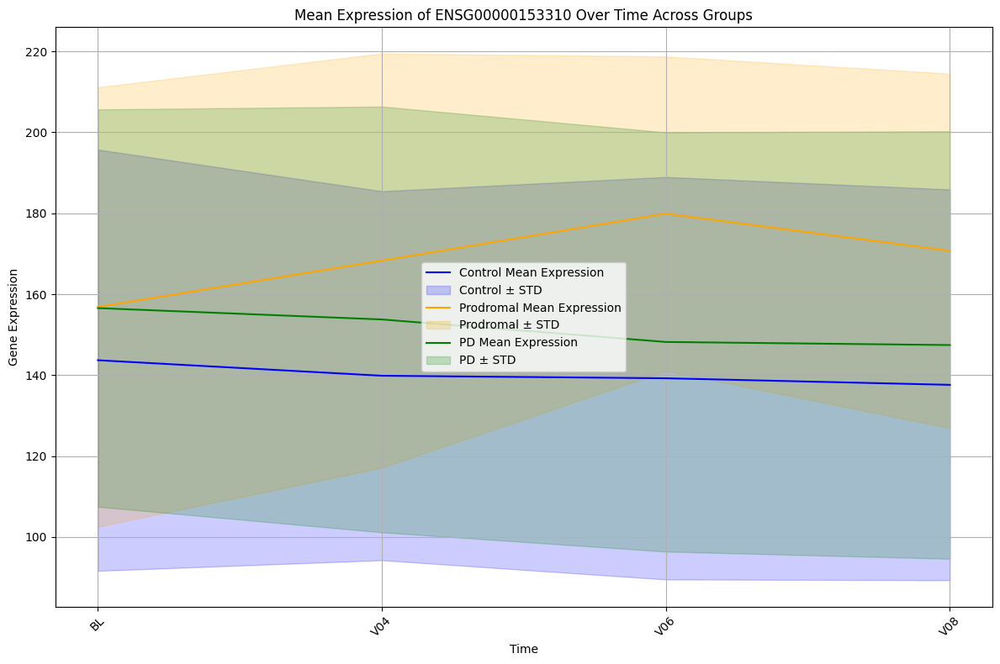

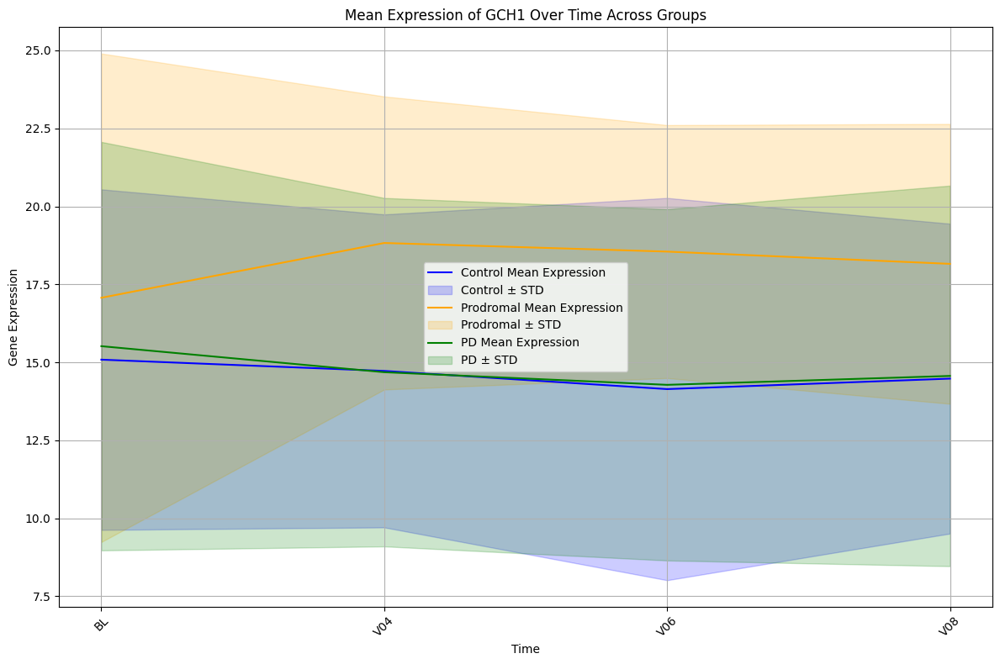

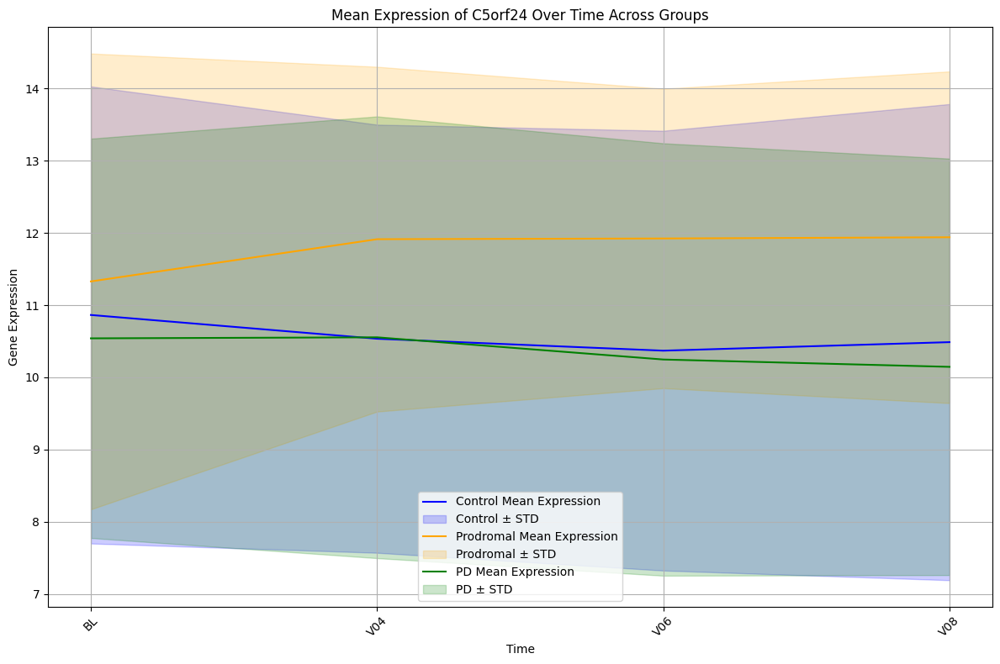

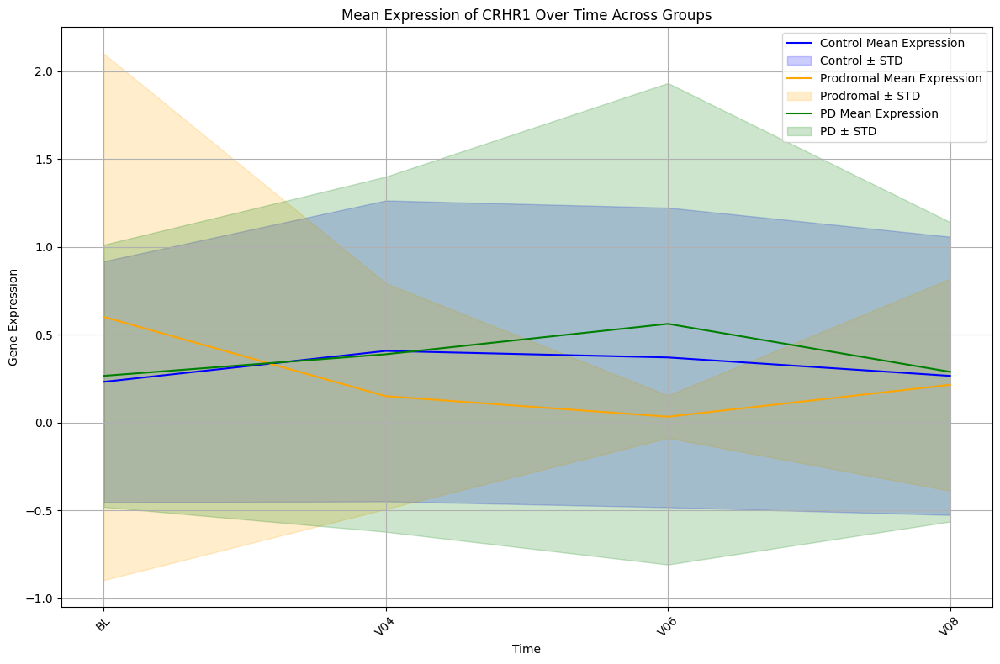

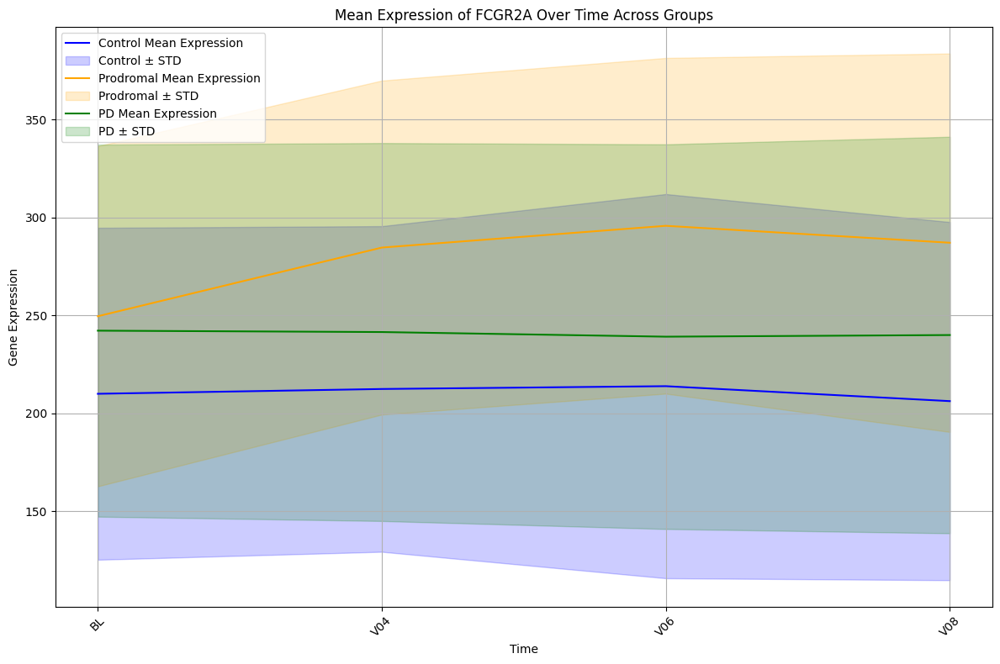

...

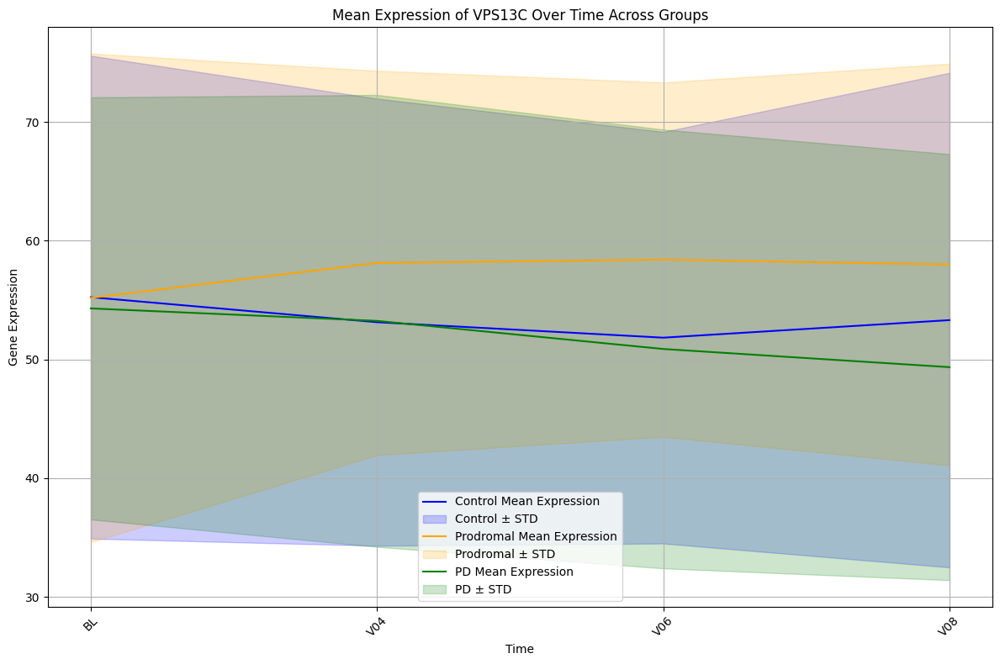

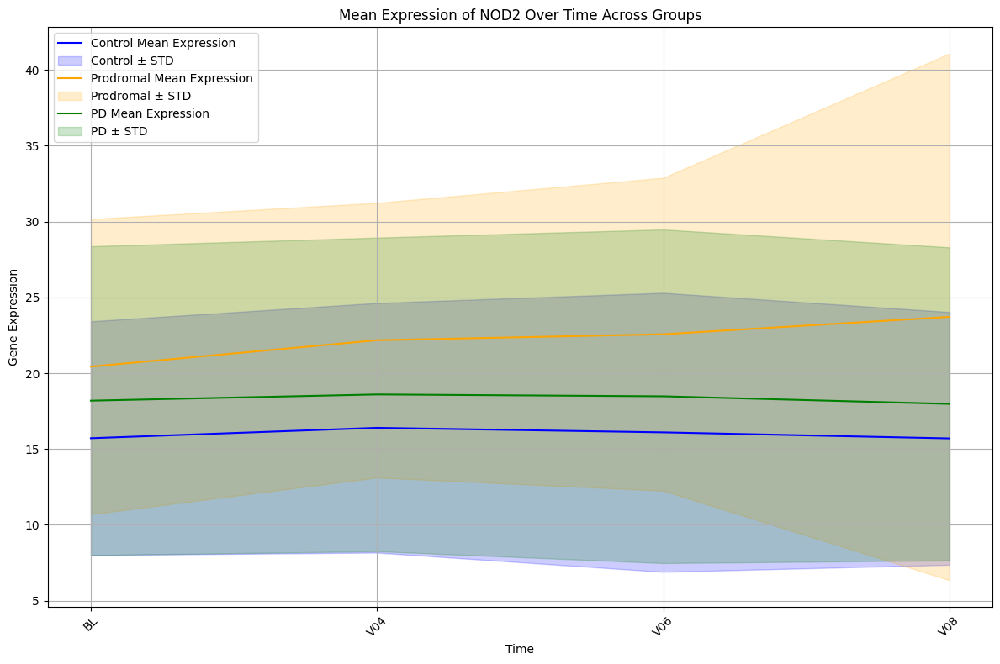

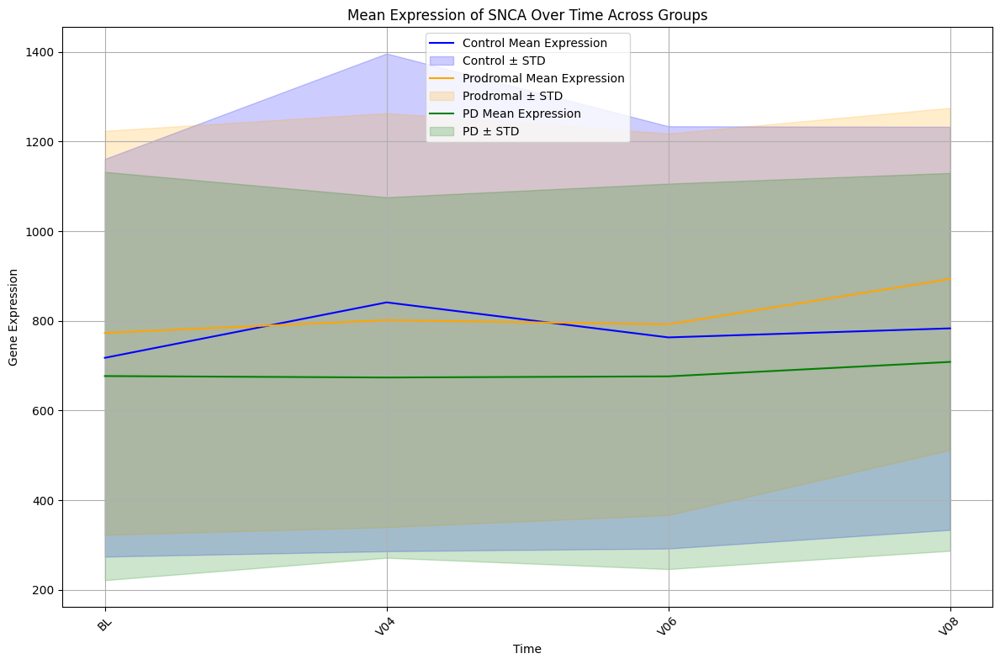

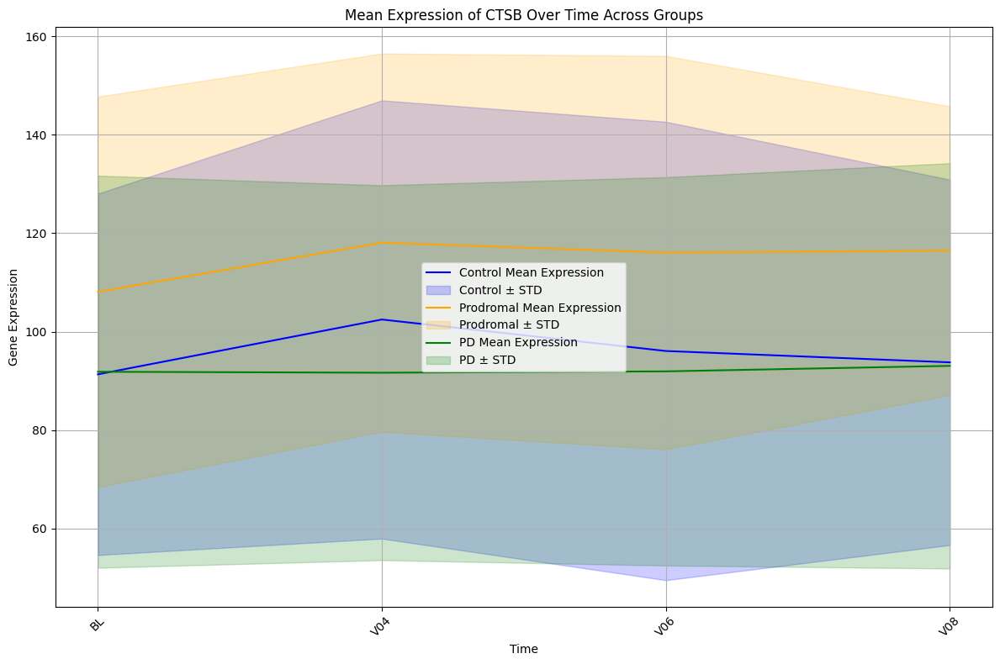

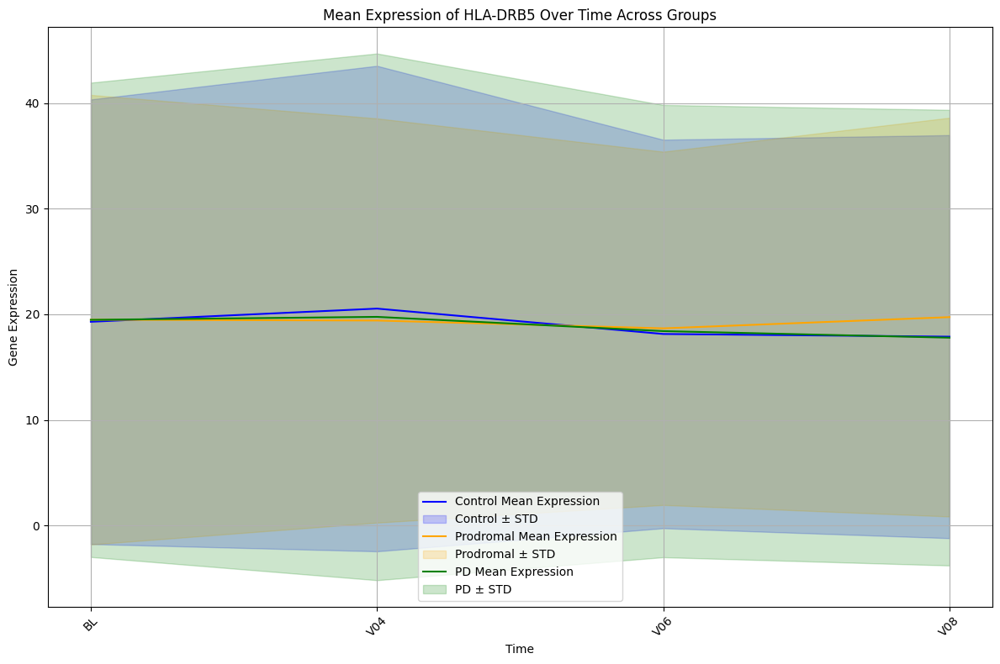

In [88]:
import matplotlib.pyplot as plt

# Loop through each gene
for gene in genes:
    # Create a new figure for each gene
    plt.figure(figsize=(12, 8))
    
    # Define a list to store the group data
    groups = ['Control', 'Prodromal', 'PD']
    colors = {'Control': 'blue', 'Prodromal': 'orange', 'PD': 'green'}
    
    for group in groups:
        # Filter and sort data by group
        group_tmp_data = tmp_data[tmp_data['New_Time_Point_2'].str.startswith(group)]
        group_tmp_data = group_tmp_data.sort_values(by='New_Time_Point')
        
        # Calculate mean and standard deviation
        mean_expression = group_tmp_data.groupby('New_Time_Point')[gene].mean()
        std_expression = group_tmp_data.groupby('New_Time_Point')[gene].std()
        
        # Extract clean time points
        index = [i.split('_')[1] for i in mean_expression.index]
        
        # Plot mean expression
        plt.plot(index, mean_expression, color=colors[group], label=f'{group} Mean Expression')
        
        # Fill the standard deviation area
        plt.fill_between(index,
                         mean_expression - std_expression,
                         mean_expression + std_expression,
                         color=colors[group], alpha=0.2, label=f'{group} ± STD')
    
    # Customize plot
    plt.xlabel('Time')
    plt.ylabel('Gene Expression')
    gene  = return_gene_name(gene)
    plt.title(f'Mean Expression of {gene} Over Time Across Groups')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Show the plot
    plt.show()



In [89]:
FEATURE_IMPORTANCES.keys()

dict_keys(['PD_V04_Control_V04_0', 'PD_V04_Control_V04_1', 'PD_V04_Control_V04_2', 'PD_V04_Control_V04_3', 'PD_V04_Control_V04_4', 'PD_V04_Control_V04_5', 'PD_V04_Control_V04_6', 'PD_V04_Control_V04_7', 'PD_V04_Control_V04_8', 'PD_V04_Control_V04_9', 'PD_V04_Control_V04_10', 'PD_V04_Control_V04_11', 'PD_V04_Control_V04_12', 'PD_V04_Control_V04_13', 'PD_V04_Control_V04_14', 'PD_V04_Control_V04_15', 'PD_V04_Control_V04_16', 'PD_V04_Control_V04_17', 'PD_V04_Control_V04_18', 'PD_V04_Control_V04_19', 'PD_V04_Control_V04_20', 'PD_V04_Control_V04_21', 'PD_V04_Control_V04_22', 'PD_V04_Control_V04_23', 'PD_V04_Control_V04_24', 'PD_V04_Control_V04_25', 'PD_V04_Control_V04_26', 'PD_V04_Control_V04_27', 'PD_V04_Control_V04_28', 'PD_V04_Control_V04_29', 'PD_V04_Control_V04_30', 'PD_V04_Control_V04_31', 'PD_V04_Control_V04_32', 'PD_V04_Control_V04_33', 'PD_V04_Control_V04_34', 'PD_V04_Control_V04_35', 'PD_V04_Control_V04_36', 'PD_V04_Control_V04_37', 'PD_V04_Control_V04_38', 'PD_V04_Control_V04_39',

In [90]:
compare_list = [ 'PD_BL_Control_BL',  'PD_V02_Control_V02' ,'PD_V04_Control_V04','PD_V06_Control_V06', 'PD_V08_Control_V08']

In [91]:
FEATURE_IMPORTANCES_PD_BL_Control_BL = dict()
FEATURE_IMPORTANCES_PD_V02_Control_V02 = dict()
FEATURE_IMPORTANCES_PD_V04_Control_V04 = dict()
FEATURE_IMPORTANCES_PD_V06_Control_V06 = dict()
FEATURE_IMPORTANCES_PD_V08_Control_V08 = dict()

for i in FEATURE_IMPORTANCES.keys():
    if 'PD_BL_Control_BL' in i:
        FEATURE_IMPORTANCES_PD_BL_Control_BL[i] = FEATURE_IMPORTANCES[i]

    elif 'PD_V02_Control_V02' in i:
        FEATURE_IMPORTANCES_PD_V02_Control_V02[i] = FEATURE_IMPORTANCES[i]

    elif 'PD_V04_Control_V04' in i:
        FEATURE_IMPORTANCES_PD_V04_Control_V04[i] = FEATURE_IMPORTANCES[i]

    elif 'PD_V06_Control_V06' in i:
        FEATURE_IMPORTANCES_PD_V06_Control_V06[i] = FEATURE_IMPORTANCES[i]

    elif 'PD_V08_Control_V08' in i:
        FEATURE_IMPORTANCES_PD_V08_Control_V08[i] = FEATURE_IMPORTANCES[i]
        
        

In [92]:
list(FEATURE_IMPORTANCES_PD_BL_Control_BL.keys())[:10]

['PD_BL_Control_BL_0',
 'PD_BL_Control_BL_1',
 'PD_BL_Control_BL_2',
 'PD_BL_Control_BL_3',
 'PD_BL_Control_BL_4',
 'PD_BL_Control_BL_5',
 'PD_BL_Control_BL_6',
 'PD_BL_Control_BL_7',
 'PD_BL_Control_BL_8',
 'PD_BL_Control_BL_9']

In [93]:
genes_list = list(FEATURE_IMPORTANCES_PD_BL_Control_BL['PD_BL_Control_BL_0'].keys())
genes_list[0:10]

['ENSG00000107862',
 'ENSG00000117533',
 'ENSG00000150672',
 'ENSG00000130787',
 'ENSG00000102547',
 'ENSG00000151929',
 'ENSG00000129003',
 'ENSG00000151338',
 'ENSG00000147439',
 'ENSG00000161682']

In [94]:
genes_list[0:10]

['ENSG00000107862',
 'ENSG00000117533',
 'ENSG00000150672',
 'ENSG00000130787',
 'ENSG00000102547',
 'ENSG00000151929',
 'ENSG00000129003',
 'ENSG00000151338',
 'ENSG00000147439',
 'ENSG00000161682']

In [95]:
len(FEATURE_IMPORTANCES_PD_BL_Control_BL.keys())

1000

In [96]:
AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_PD_BL_Control_BL.keys():
        s += FEATURE_IMPORTANCES_PD_BL_Control_BL[k][i]
    s = s/len(FEATURE_IMPORTANCES_PD_BL_Control_BL.keys())
    AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL[i] = s


AVG_FEATURE_IMPORTANCES_PD_V02_Control_V02 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_PD_V02_Control_V02.keys():
        s += FEATURE_IMPORTANCES_PD_V02_Control_V02[k][i]
    s = s/len(FEATURE_IMPORTANCES_PD_V02_Control_V02.keys())
    AVG_FEATURE_IMPORTANCES_PD_V02_Control_V02[i] = s


AVG_FEATURE_IMPORTANCES_PD_V04_Control_V04 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_PD_V04_Control_V04.keys():
        s += FEATURE_IMPORTANCES_PD_V04_Control_V04[k][i]
    s = s/len(FEATURE_IMPORTANCES_PD_V04_Control_V04.keys())
    AVG_FEATURE_IMPORTANCES_PD_V04_Control_V04[i] = s


AVG_FEATURE_IMPORTANCES_PD_V06_Control_V06 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_PD_V06_Control_V06.keys():
        s += FEATURE_IMPORTANCES_PD_V06_Control_V06[k][i]
    s = s/len(FEATURE_IMPORTANCES_PD_V06_Control_V06.keys())
    AVG_FEATURE_IMPORTANCES_PD_V06_Control_V06[i] = s


AVG_FEATURE_IMPORTANCES_PD_V08_Control_V08 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_PD_V08_Control_V08.keys():
        s += FEATURE_IMPORTANCES_PD_V08_Control_V08[k][i]
    s = s/len(FEATURE_IMPORTANCES_PD_V08_Control_V08.keys())
    AVG_FEATURE_IMPORTANCES_PD_V08_Control_V08[i] = s
      

In [97]:
compare_list

['PD_BL_Control_BL',
 'PD_V02_Control_V02',
 'PD_V04_Control_V04',
 'PD_V06_Control_V06',
 'PD_V08_Control_V08']

In [98]:
FEATURE_IMPORTANCES_MERGE = dict()
FEATURE_IMPORTANCES_MERGE['PD_BL_Control_BL'] = AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL
FEATURE_IMPORTANCES_MERGE['PD_V02_Control_V02'] = AVG_FEATURE_IMPORTANCES_PD_V02_Control_V02
FEATURE_IMPORTANCES_MERGE['PD_V04_Control_V04'] = AVG_FEATURE_IMPORTANCES_PD_V04_Control_V04
FEATURE_IMPORTANCES_MERGE['PD_V06_Control_V06'] = AVG_FEATURE_IMPORTANCES_PD_V06_Control_V06
FEATURE_IMPORTANCES_MERGE['PD_V08_Control_V08'] = AVG_FEATURE_IMPORTANCES_PD_V08_Control_V08


In [99]:
pd.DataFrame(FEATURE_IMPORTANCES_MERGE['PD_BL_Control_BL'].items())

,0,1
0,ENSG00000107862,0.332354
1,ENSG00000117533,0.410014
2,ENSG00000150672,-0.144713
3,ENSG00000130787,-0.144391
4,ENSG00000102547,0.408709
...,...,...
77,ENSG00000110315,0.027423
78,ENSG00000177455,-0.488497
79,ENSG00000078579,-0.443533
80,ENSG00000198502,0.004630


In [100]:
ranking_of_features = []
for i in compare_list:


    df = pd.DataFrame(FEATURE_IMPORTANCES_MERGE[i].items())
    df[2] = np.abs(df[1])
    df = df.sort_values(by = 2, ascending=False)
    print(df)
    ranking_of_features.append(df[0].tolist())


                  0         1         2
70  ENSG00000170745 -0.965099  0.965099
31  ENSG00000120088 -0.896540  0.896540
5   ENSG00000151929 -0.697604  0.697604
45  ENSG00000170175  0.679528  0.679528
32  ENSG00000103528  0.626302  0.626302
..              ...       ...       ...
80  ENSG00000198502  0.004630  0.004630
57  ENSG00000145730 -0.004601  0.004601
75  ENSG00000164733  0.003486  0.003486
24  ENSG00000112306 -0.002273  0.002273
36  ENSG00000145335  0.000667  0.000667

[82 rows x 3 columns]
                  0         1         2
31  ENSG00000120088 -1.201314  1.201314
81  ENSG00000136235 -0.714856  0.714856
39  ENSG00000077943 -0.650596  0.650596
27  ENSG00000163344  0.639224  0.639224
7   ENSG00000151338  0.602613  0.602613
..              ...       ...       ...
55  ENSG00000117280  0.001694  0.001694
24  ENSG00000112306 -0.000948  0.000948
80  ENSG00000198502  0.000919  0.000919
17  ENSG00000143226 -0.000573  0.000573
36  ENSG00000145335  0.000480  0.000480

[82 rows x 3 col

In [101]:
ranking_of_features[4][0:10]

['ENSG00000102547',
 'ENSG00000187775',
 'ENSG00000170175',
 'ENSG00000115041',
 'ENSG00000151929',
 'ENSG00000136235',
 'ENSG00000170745',
 'ENSG00000136492',
 'ENSG00000152214',
 'ENSG00000143772']

In [102]:
gene_lists = ranking_of_features

In [103]:
gene_lists

[['ENSG00000170745',
  'ENSG00000120088',
  'ENSG00000151929',
  'ENSG00000170175',
  'ENSG00000103528',
  'ENSG00000198208',
  'ENSG00000177455',
  'ENSG00000141431',
  'ENSG00000136235',
  'ENSG00000078579',
  'ENSG00000161682',
  'ENSG00000117533',
  'ENSG00000102547',
  'ENSG00000115041',
  'ENSG00000080854',
  'ENSG00000107862',
  'ENSG00000139793',
  'ENSG00000189157',
  'ENSG00000152214',
  'ENSG00000272414',
  'ENSG00000108379',
  'ENSG00000005206',
  'ENSG00000198825',
  'ENSG00000108312',
  'ENSG00000127419',
  'ENSG00000187775',
  'ENSG00000181904',
  'ENSG00000196542',
  'ENSG00000114030',
  'ENSG00000099381',
  'ENSG00000088766',
  'ENSG00000138760',
  'ENSG00000136492',
  'ENSG00000150672',
  'ENSG00000130787',
  'ENSG00000068745',
  'ENSG00000176624',
  'ENSG00000163463',
  'ENSG00000249231',
  'ENSG00000069275',
  'ENSG00000137073',
  'ENSG00000077943',
  'ENSG00000145349',
  'ENSG00000198648',
  'ENSG00000144893',
  'ENSG00000204614',
  'ENSG00000143772',
  'ENSG000001

In [104]:
gene_indices = {}

# Loop through each list and index each gene
for list_idx, gene_list in enumerate(gene_lists):
    for gene_idx, gene in enumerate(gene_list):
        # Initialize the gene's entry if not present
        if gene not in gene_indices:
            gene_indices[gene] = [-1] * len(gene_lists)  # Default -1 for lists where gene is absent
        # Update the index of the gene in the current list
        gene_indices[gene][list_idx] = gene_idx

# Display results
for gene, indices in gene_indices.items():
    print(f"{gene}: {indices}")

ENSG00000170745: [0, 62, 15, 30, 6]
ENSG00000120088: [1, 0, 4, 61, 58]
ENSG00000151929: [2, 19, 19, 11, 4]
ENSG00000170175: [3, 10, 44, 24, 2]
ENSG00000103528: [4, 31, 5, 0, 16]
ENSG00000198208: [5, 12, 0, 48, 45]
ENSG00000177455: [6, 70, 38, 9, 21]
ENSG00000141431: [7, 48, 24, 15, 30]
ENSG00000136235: [8, 1, 7, 47, 5]
ENSG00000078579: [9, 37, 11, 33, 20]
ENSG00000161682: [10, 5, 42, 6, 29]
ENSG00000117533: [11, 25, 32, 17, 13]
ENSG00000102547: [12, 9, 18, 8, 0]
ENSG00000115041: [13, 27, 3, 2, 3]
ENSG00000080854: [14, 75, 37, 67, 27]
ENSG00000107862: [15, 8, 6, 13, 47]
ENSG00000139793: [16, 46, 58, 14, 38]
ENSG00000189157: [17, 50, 8, 35, 44]
ENSG00000152214: [18, 59, 36, 3, 8]
ENSG00000272414: [19, 7, 26, 36, 14]
ENSG00000108379: [20, 58, 73, 18, 50]
ENSG00000005206: [21, 24, 68, 23, 46]
ENSG00000198825: [22, 65, 50, 40, 55]
ENSG00000108312: [23, 29, 52, 46, 22]
ENSG00000127419: [24, 14, 48, 50, 35]
ENSG00000187775: [25, 76, 9, 41, 1]
ENSG00000181904: [26, 33, 45, 12, 48]
ENSG00000196

In [105]:
ranking_df = pd.DataFrame(gene_indices).T
ranking_df.columns = ['BL','V02','V04','V06','V08']

In [106]:
ranking_df

,BL,V02,V04,V06,V08
ENSG00000170745,0,62,15,30,6
ENSG00000120088,1,0,4,61,58
ENSG00000151929,2,19,19,11,4
ENSG00000170175,3,10,44,24,2
ENSG00000103528,4,31,5,0,16
...,...,...,...,...,...
ENSG00000198502,77,79,76,73,78
ENSG00000145730,78,71,78,71,72
ENSG00000164733,79,72,70,74,80
ENSG00000112306,80,78,77,77,77


In [107]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

In [108]:
tmp_df = ranking_df.reset_index()
ranking_df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()

In [109]:
ranking_df[ranking_df.Gene_Name.isna()]

,BL,V02,V04,V06,V08,Gene_Name
ENSG00000153310,64,69,79,72,63,NaN


In [110]:
ranking_df.loc['ENSG00000153310','Gene_Name'] = 'FAM49B'


In [111]:
ranking_df.set_index('Gene_Name',inplace=True)
ranking_df

,BL,V02,V04,V06,V08
Gene_Name,,,,,
KCNS3,0,62,15,30,6
CRHR1,1,0,4,61,58
BAG3,2,19,19,11,4
CHRNB1,3,10,44,24,2
SYT17,4,31,5,0,16
...,...,...,...,...,...
HLA-DRB5,77,79,76,73,78
PAM,78,71,78,71,72
CTSB,79,72,70,74,80


In [112]:
ranking_df.to_csv('ranking_df/LANCET_pd_genes_control_to_pd_ranking_df.csv', index=True)

In [113]:
!pwd

/12tb_dsk3/PD_classifier/with_smug_1/New_Gene_sets


In [114]:
ranking_of_features

[['ENSG00000170745',
  'ENSG00000120088',
  'ENSG00000151929',
  'ENSG00000170175',
  'ENSG00000103528',
  'ENSG00000198208',
  'ENSG00000177455',
  'ENSG00000141431',
  'ENSG00000136235',
  'ENSG00000078579',
  'ENSG00000161682',
  'ENSG00000117533',
  'ENSG00000102547',
  'ENSG00000115041',
  'ENSG00000080854',
  'ENSG00000107862',
  'ENSG00000139793',
  'ENSG00000189157',
  'ENSG00000152214',
  'ENSG00000272414',
  'ENSG00000108379',
  'ENSG00000005206',
  'ENSG00000198825',
  'ENSG00000108312',
  'ENSG00000127419',
  'ENSG00000187775',
  'ENSG00000181904',
  'ENSG00000196542',
  'ENSG00000114030',
  'ENSG00000099381',
  'ENSG00000088766',
  'ENSG00000138760',
  'ENSG00000136492',
  'ENSG00000150672',
  'ENSG00000130787',
  'ENSG00000068745',
  'ENSG00000176624',
  'ENSG00000163463',
  'ENSG00000249231',
  'ENSG00000069275',
  'ENSG00000137073',
  'ENSG00000077943',
  'ENSG00000145349',
  'ENSG00000198648',
  'ENSG00000144893',
  'ENSG00000204614',
  'ENSG00000143772',
  'ENSG000001

In [115]:
subset_dict = {key: gene_indices[key] for key in ranking_of_features[4] if key in gene_indices}

print(subset_dict)

{'ENSG00000102547': [12, 9, 18, 8, 0], 'ENSG00000187775': [25, 76, 9, 41, 1], 'ENSG00000170175': [3, 10, 44, 24, 2], 'ENSG00000115041': [13, 27, 3, 2, 3], 'ENSG00000151929': [2, 19, 19, 11, 4], 'ENSG00000136235': [8, 1, 7, 47, 5], 'ENSG00000170745': [0, 62, 15, 30, 6], 'ENSG00000136492': [32, 6, 10, 69, 7], 'ENSG00000152214': [18, 59, 36, 3, 8], 'ENSG00000143772': [46, 34, 25, 21, 9], 'ENSG00000077943': [41, 2, 2, 4, 10], 'ENSG00000079841': [58, 11, 23, 26, 11], 'ENSG00000204614': [45, 16, 16, 22, 12], 'ENSG00000117533': [11, 25, 32, 17, 13], 'ENSG00000272414': [19, 7, 26, 36, 14], 'ENSG00000117280': [54, 77, 14, 5, 15], 'ENSG00000103528': [4, 31, 5, 0, 16], 'ENSG00000144893': [44, 40, 12, 10, 17], 'ENSG00000151338': [61, 4, 28, 25, 18], 'ENSG00000152128': [63, 18, 22, 7, 19], 'ENSG00000078579': [9, 37, 11, 33, 20], 'ENSG00000177455': [6, 70, 38, 9, 21], 'ENSG00000108312': [23, 29, 52, 46, 22], 'ENSG00000196542': [27, 15, 40, 16, 23], 'ENSG00000163344': [51, 3, 64, 1, 24], 'ENSG0000011

In [116]:
len(subset_dict)

82

In [117]:
subset_dict.values()

dict_values([[12, 9, 18, 8, 0], [25, 76, 9, 41, 1], [3, 10, 44, 24, 2], [13, 27, 3, 2, 3], [2, 19, 19, 11, 4], [8, 1, 7, 47, 5], [0, 62, 15, 30, 6], [32, 6, 10, 69, 7], [18, 59, 36, 3, 8], [46, 34, 25, 21, 9], [41, 2, 2, 4, 10], [58, 11, 23, 26, 11], [45, 16, 16, 22, 12], [11, 25, 32, 17, 13], [19, 7, 26, 36, 14], [54, 77, 14, 5, 15], [4, 31, 5, 0, 16], [44, 40, 12, 10, 17], [61, 4, 28, 25, 18], [63, 18, 22, 7, 19], [9, 37, 11, 33, 20], [6, 70, 38, 9, 21], [23, 29, 52, 46, 22], [27, 15, 40, 16, 23], [51, 3, 64, 1, 24], [48, 17, 17, 56, 25], [59, 51, 43, 68, 26], [14, 75, 37, 67, 27], [52, 21, 61, 31, 28], [10, 5, 42, 6, 29], [7, 48, 24, 15, 30], [72, 41, 41, 62, 31], [47, 47, 27, 19, 32], [35, 23, 20, 78, 33], [49, 61, 56, 43, 34], [24, 14, 48, 50, 35], [55, 22, 51, 63, 36], [36, 28, 13, 29, 37], [16, 46, 58, 14, 38], [33, 13, 33, 38, 39], [30, 36, 55, 51, 40], [50, 53, 65, 39, 41], [38, 26, 1, 20, 42], [40, 20, 35, 28, 43], [17, 50, 8, 35, 44], [5, 12, 0, 48, 45], [21, 24, 68, 23, 46]

In [118]:
# Original dictionary with gene rankings
'''gene_ranks = subset_dict


# Flatten the list to find the min and max values across all rankings
all_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]
min_rank, max_rank = min(all_ranks), max(all_ranks)

# Normalize each ranking
normalized_gene_ranks = {
    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]
    for gene, ranks in gene_ranks.items()
}

# Display the normalized rankings
for gene, normalized_ranks in normalized_gene_ranks.items():
    print(f"{gene}: {normalized_ranks}")
'''

'gene_ranks = subset_dict\n\n\n# Flatten the list to find the min and max values across all rankings\nall_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]\nmin_rank, max_rank = min(all_ranks), max(all_ranks)\n\n# Normalize each ranking\nnormalized_gene_ranks = {\n    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]\n    for gene, ranks in gene_ranks.items()\n}\n\n# Display the normalized rankings\nfor gene, normalized_ranks in normalized_gene_ranks.items():\n    print(f"{gene}: {normalized_ranks}")\n'

In [119]:
gene_ranks = subset_dict
df = pd.DataFrame(gene_ranks).T
df

,0,1,2,3,4
ENSG00000102547,12,9,18,8,0
ENSG00000187775,25,76,9,41,1
ENSG00000170175,3,10,44,24,2
ENSG00000115041,13,27,3,2,3
ENSG00000151929,2,19,19,11,4
...,...,...,...,...,...
ENSG00000112306,80,78,77,77,77
ENSG00000198502,77,79,76,73,78
ENSG00000143226,70,80,75,79,79
ENSG00000164733,79,72,70,74,80


In [120]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

tmp_df = df.reset_index()
df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()
df.loc['ENSG00000153310','Gene_Name'] = 'FAM49B'
df.set_index('Gene_Name',inplace=True)

In [121]:
df

,0,1,2,3,4
Gene_Name,,,,,
CAB39L,12,9,18,8,0
DNAH17,25,76,9,41,1
CHRNB1,3,10,44,24,2
KCNIP3,13,27,3,2,3
BAG3,2,19,19,11,4
...,...,...,...,...,...
RPS12,80,78,77,77,77
HLA-DRB5,77,79,76,73,78
FCGR2A,70,80,75,79,79


In [122]:
ranked_df = df.rank(axis=0, method='min').astype(int)

print(ranked_df)

            0   1   2   3   4
Gene_Name                    
CAB39L     13  10  19   9   1
DNAH17     26  77  10  42   2
CHRNB1      4  11  45  25   3
KCNIP3     14  28   4   3   4
BAG3        3  20  20  12   5
...        ..  ..  ..  ..  ..
RPS12      81  79  78  78  78
HLA-DRB5   78  80  77  74  79
FCGR2A     71  81  76  80  80
CTSB       80  73  71  75  81
SNCA       82  82  81  81  82

[82 rows x 5 columns]


In [123]:
reversed_ranks = ranked_df .max() - ranked_df  + 1

print(reversed_ranks)

            0   1   2   3   4
Gene_Name                    
CAB39L     70  73  64  74  82
DNAH17     57   6  73  41  81
CHRNB1     79  72  38  58  80
KCNIP3     69  55  79  80  79
BAG3       80  63  63  71  78
...        ..  ..  ..  ..  ..
RPS12       2   4   5   5   5
HLA-DRB5    5   3   6   9   4
FCGR2A     12   2   7   3   3
CTSB        3  10  12   8   2
SNCA        1   1   2   2   1

[82 rows x 5 columns]


In [124]:
rank_dict = reversed_ranks.T.to_dict(orient='list')
rank_dict

{'CAB39L': [70, 73, 64, 74, 82],
 'DNAH17': [57, 6, 73, 41, 81],
 'CHRNB1': [79, 72, 38, 58, 80],
 'KCNIP3': [69, 55, 79, 80, 79],
 'BAG3': [80, 63, 63, 71, 78],
 'GPNMB': [74, 81, 75, 35, 77],
 'KCNS3': [82, 20, 67, 52, 76],
 'BRIP1': [50, 76, 72, 13, 75],
 'RIT2': [64, 23, 46, 79, 74],
 'ITPKB': [36, 48, 57, 61, 73],
 'ITGA8': [41, 80, 80, 78, 72],
 'RIMS1': [24, 71, 59, 56, 71],
 'TRIM40': [37, 66, 66, 60, 70],
 'VAMP4': [71, 57, 50, 65, 69],
 'FAM47E-STBD1': [63, 75, 56, 46, 68],
 'RAB29': [28, 5, 68, 77, 67],
 'SYT17': [78, 51, 77, 82, 66],
 'MED12L': [38, 42, 70, 72, 65],
 'MIPOL1': [21, 78, 54, 57, 64],
 'TMEM163': [19, 64, 60, 75, 63],
 'FGF20': [73, 45, 71, 49, 62],
 'CD19': [76, 12, 44, 73, 61],
 'UBTF': [59, 53, 30, 36, 60],
 'SPTSSB': [55, 67, 42, 66, 59],
 'PMVK': [31, 79, 18, 81, 58],
 'FBRSL1': [34, 65, 65, 26, 57],
 'CHD9': [23, 31, 39, 14, 56],
 'IGSF9B': [68, 7, 45, 15, 55],
 'LCORL': [30, 61, 21, 51, 54],
 'FAM171A2': [72, 77, 40, 76, 53],
 'ASXL3': [75, 34, 58, 67, 

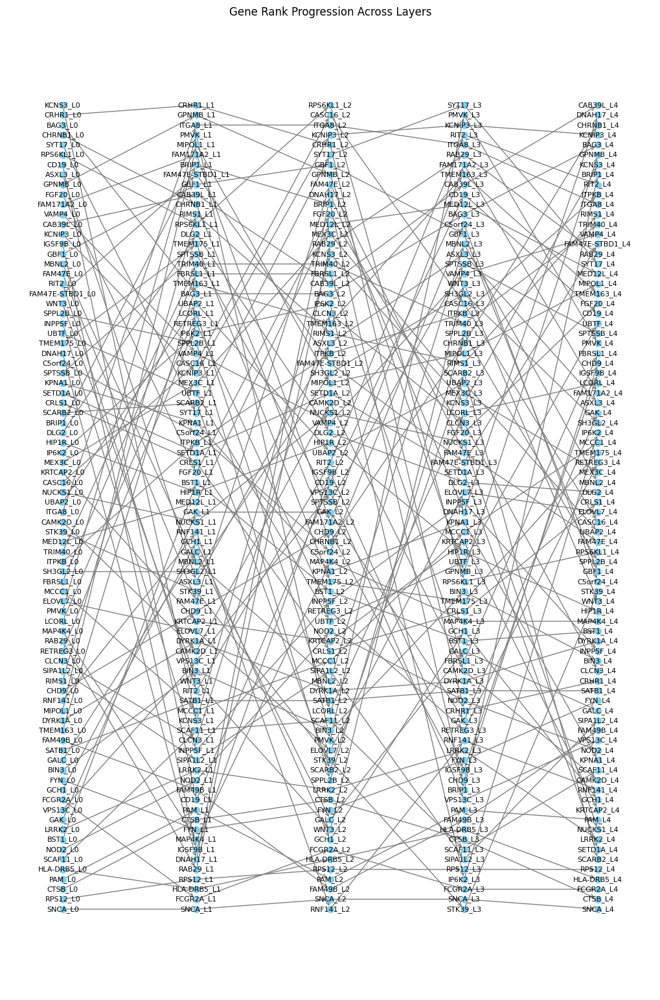

In [125]:
import matplotlib.pyplot as plt
import networkx as nx

# The rank positions for each gene across four layers
gene_ranks = rank_dict

G = nx.DiGraph()

# Number of layers
num_layers = len(next(iter(gene_ranks.values())))

# Add nodes and edges for each gene across the layers
for gene, ranks in gene_ranks.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(10, 15))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8, arrowstyle='->', arrowsize=10, node_color="skyblue", edge_color="gray")

plt.title("Gene Rank Progression Across Layers")
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower
plt.show()

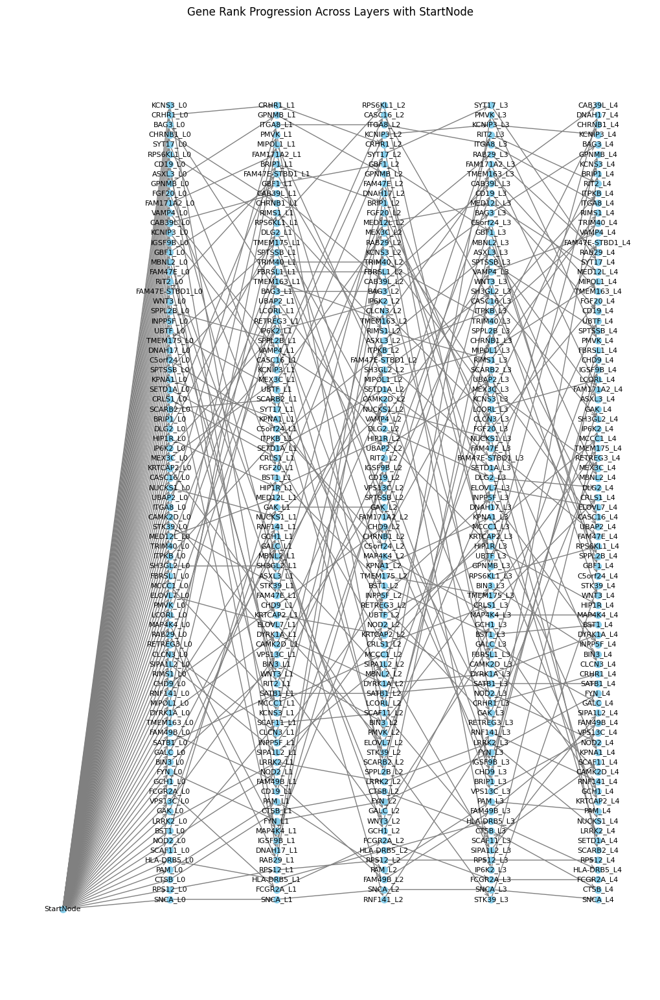

In [126]:
import matplotlib.pyplot as plt
import networkx as nx

# Example rank dictionary (you should replace this with your actual rank_dict)

# Create the directed graph
G = nx.DiGraph()

# Number of layers (based on the length of the rank list)
num_layers = len(next(iter(rank_dict.values())))

# Add the start node before the first layer
start_node = "StartNode"
G.add_node(start_node, layer=-1, rank=0)  # Layer -1 to indicate it's before the first layer

# Add nodes and edges for each gene across the layers
for gene, ranks in rank_dict.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)
    
    # Add edges from the start node to the first layer nodes
    first_layer_node = f"{gene}_L0"
    G.add_edge(start_node, first_layer_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(10, 15))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8, arrowstyle='->', arrowsize=10, node_color="skyblue", edge_color="gray")

# Title and labels
plt.title("Gene Rank Progression Across Layers with StartNode")
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower
plt.savefig("gene_rank_progression.svg", format="svg")
plt.savefig("smaller_plots/smaller_gene_ranked_prgression_control_to_pd.png", dpi=100)

plt.show()


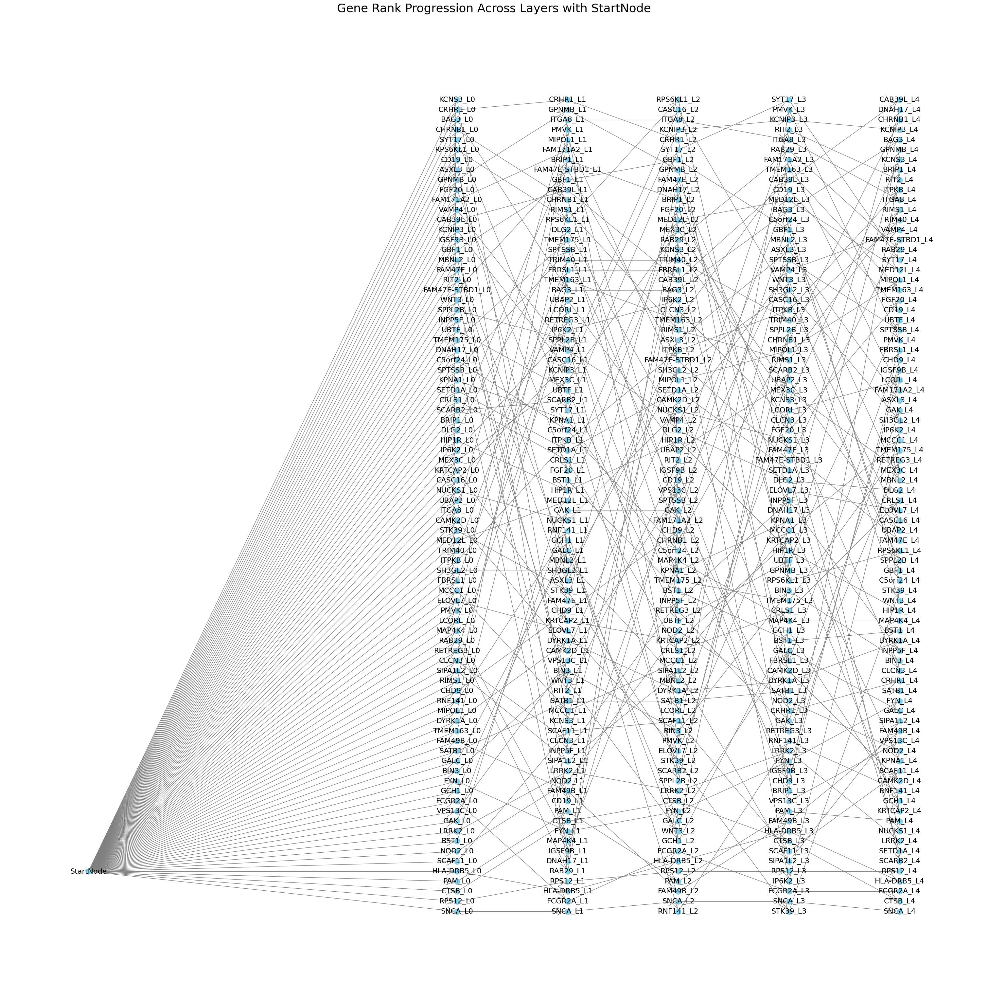

In [127]:
import matplotlib.pyplot as plt
import networkx as nx

# Example rank dictionary (you should replace this with your actual rank_dict)



# Create the directed graph
G = nx.DiGraph()

# Number of layers (based on the length of the rank list)
num_layers = len(next(iter(rank_dict.values())))

# Add the start node before the first layer
start_node = "StartNode"
G.add_node(start_node, layer=-1, rank=0)  # Layer -1 to indicate it's before the first layer

# Add nodes and edges for each gene across the layers
for gene, ranks in rank_dict.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)
    
    # Add edges from the start node to the first layer nodes
    first_layer_node = f"{gene}_L0"
    G.add_edge(start_node, first_layer_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

# Set the position of the StartNode to be at the mid-left of the first layer
start_node_x_pos = -5 # Fixed position on the left
start_node_y_pos = -1.5  # Middle of first layer vertically

# Position the nodes
for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    
    if layer == -1:
        # Place the StartNode on the mid-left of the first layer
        pos[node] = (start_node_x_pos, start_node_y_pos)
    else:
        # Place other nodes based on their layer and rank
        pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(30, 30))
nx.draw(G, pos, with_labels=True, node_size=150, font_size=16, arrowstyle='->', arrowsize=40, node_color="skyblue", edge_color="gray")

# Title and labels
plt.title("Gene Rank Progression Across Layers with StartNode", fontsize=26)
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower

# Save the plot as an SVG file
plt.savefig("gene_rank_progression_with_start_node_left.svg", format="svg")
plt.savefig("gene_rank_progression_with_start_node_left.png", format="png")
# Show the plot
plt.show()


In [128]:
!mkdir -p feature_importance_weights/lancet_genes/control_vs_pd

In [129]:
def return_value(i):

    l = [AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL[i],AVG_FEATURE_IMPORTANCES_PD_V02_Control_V02[i],AVG_FEATURE_IMPORTANCES_PD_V04_Control_V04[i],
    AVG_FEATURE_IMPORTANCES_PD_V06_Control_V06[i],AVG_FEATURE_IMPORTANCES_PD_V08_Control_V08[i]]
    return l


li = []
genes = []
for i in AVG_FEATURE_IMPORTANCES_PD_BL_Control_BL.keys():
    
    li.append(return_value(i))
    genes.append(i)

df = pd.DataFrame(li)
df['genes'] = genes
df = df.set_index('genes')
df.columns = ['BL','V02','V04','V06','V08']
df['Gene_Name'] =df.reset_index()['genes'].apply(return_gene_name).tolist()
df = df.set_index('Gene_Name')
df.to_csv(f'feature_importance_weights/lancet_genes//control_vs_pd/control_vs_pd.csv',index = True)
df


,BL,V02,V04,V06,V08
Gene_Name,,,,,
GBF1,0.332354,0.492871,0.480960,-0.263299,0.058734
VAMP4,0.410014,0.184474,0.119030,-0.222798,0.337114
DLG2,-0.144713,-0.330338,-0.118846,0.101193,-0.102634
HIP1R,-0.144391,0.093404,-0.110323,-0.082240,0.043479
CAB39L,0.408709,0.385041,0.227073,0.318365,1.050376
...,...,...,...,...,...
RNF141,0.027423,-0.078599,0.000505,0.023160,-0.013046
CD19,-0.488497,0.006308,-0.088403,-0.288132,-0.251509
FGF20,-0.443533,-0.097878,-0.373200,0.117383,0.253058


In [ ]:
A